# 1. Camera Calibration

In [500]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import numpy as np
import cv2
import os
import glob

In [501]:
# condition
file_extension = '.jpg'
video_extension = '.mp4'
inputdir_chessbox = './camera_cal'
inputdir_image = './test_images'
inputdir_video = './'
outputdir_image = './output_images'
outputdir_video = './output_video'
nx = 9 # chessbox width
ny = 6 # chessbox height
xm_per_pix = 3.7/700 #[m/pixel] in x dimension
ym_per_pix = 30/720  #[m/pixel] in y dimension

# create the folder if nothing
if not os.path.isdir(outputdir_image):
    os.mkdir(outputdir_image)
if not os.path.isdir(outputdir_video):
    os.mkdir(outputdir_video)
    
# get file name list
currentdir = os.getcwd()
os.chdir(inputdir_chessbox)
file_list = glob.glob('*' + file_extension)
os.chdir(currentdir)

# prepare object point
objpoints = []
imgpoints = []
objp = np.zeros((nx*ny,3), np.float32)
objp[:,:2] = np.mgrid[0:nx,0:ny].T.reshape(-1,2)

# check every chessbox image
remaining_file = []
for eachfile in file_list:
    img = mpimg.imread(f'{inputdir_chessbox}/{eachfile}')
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    ret, corners = cv2.findChessboardCorners(gray, (nx,ny), None)
    
    if ret == True:
        objpoints.append(objp)
        imgpoints.append(corners)
        cv2.drawChessboardCorners(img, (nx, ny), corners, ret) # Draw and display the corners
    else:
        print('Notification: cannot find chessbox in', eachfile)
        remaining_file.append(eachfile)

Notification: cannot find chessbox in calibration5.jpg
Notification: cannot find chessbox in calibration4.jpg
Notification: cannot find chessbox in calibration1.jpg


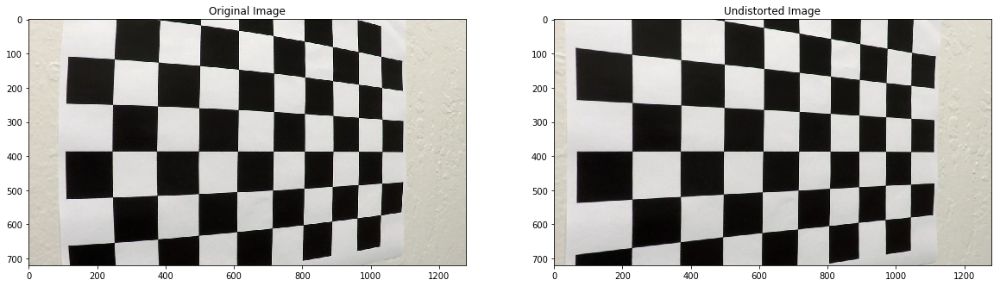

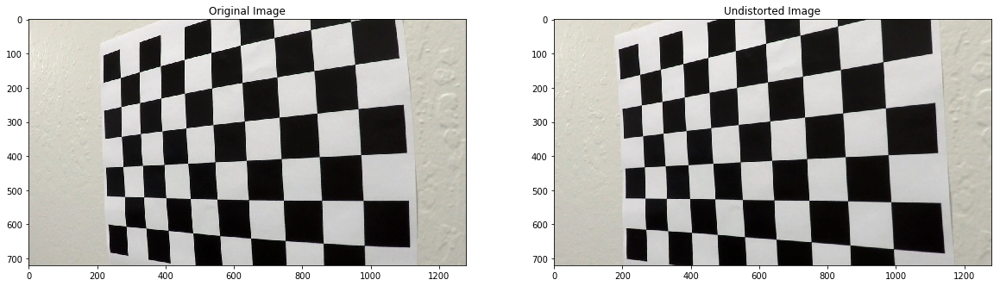

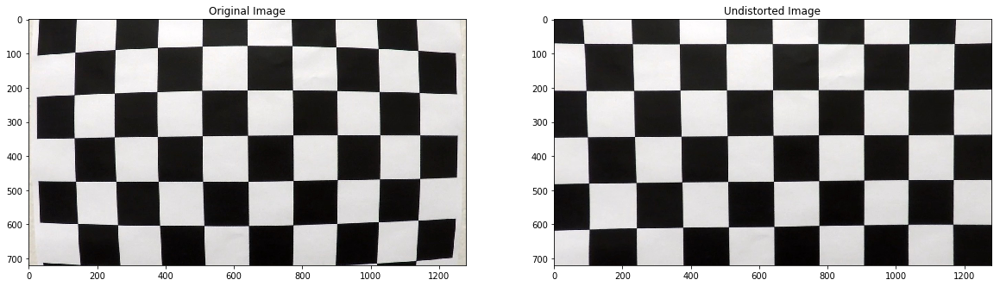

In [502]:
def cal_undistort(img, objpoints, imgpoints):
    # Use cv2.calibrateCamera() and cv2.undistort()
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, img.shape[1:], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

def image_plot(img, img_result, title_1='Input', title_2='Output', cmap_1=None, cmap_2=None):
    fig = plt.figure(figsize=(20,10))
    # draw input image
    ax1 = fig.add_subplot(1,2,1)
    ax1.imshow(img, cmap=cmap_1)
    ax1.set_title(title_1)
    # draw output image
    ax2 = fig.add_subplot(1,2,2)
    ax2.imshow(img_result, cmap=cmap_2)
    ax2.set_title(title_2)
    return fig, ax1, ax2

if len(remaining_file) == 0:
    remaining_file.append('calibration1.jpg') 

# check undistortion result for the image which we couldn't find chessbox
for eachfile in remaining_file:
    img = mpimg.imread(f'{inputdir_chessbox}/{eachfile}')
    undistorted = cal_undistort(img, objpoints, imgpoints)
    fig, ax1, ax2 = image_plot(img, undistorted, title_1='Original Image', title_2='Undistorted Image')
    plt.show()
    fig.savefig('{}/{}_undistorted{}'.format(outputdir_image, eachfile.split(file_extension)[0], file_extension))
    #mpimg.imsave(f'{outputdir_image}/{eachfile.split(file_extension)[0]}_undistorted{file_extension}', img)

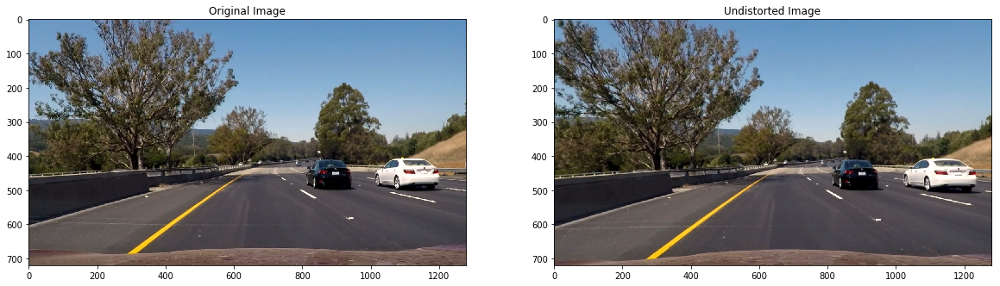

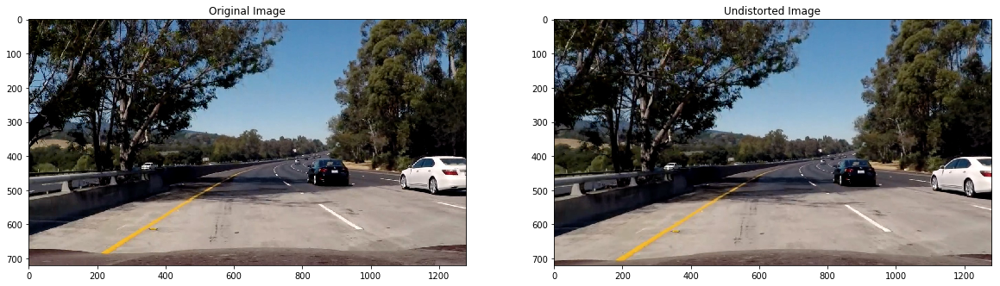

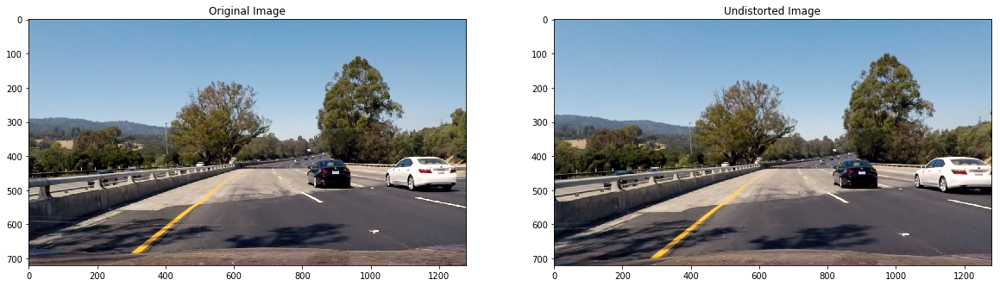

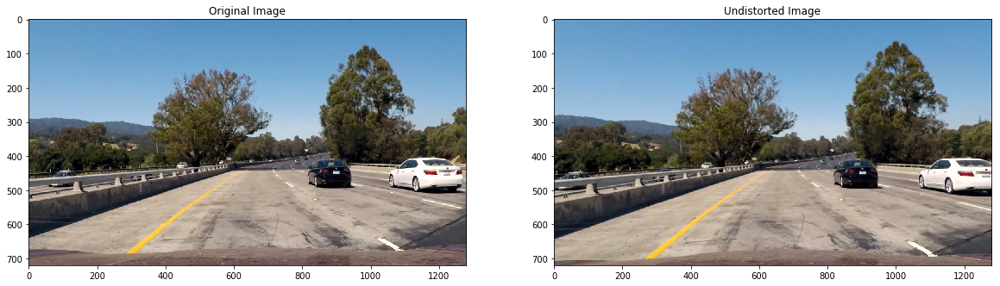

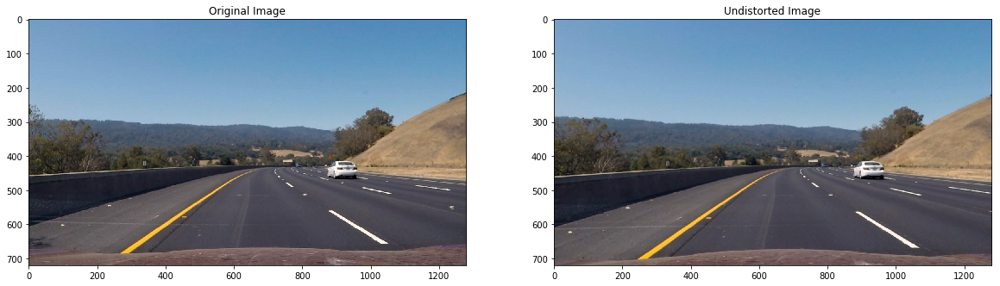

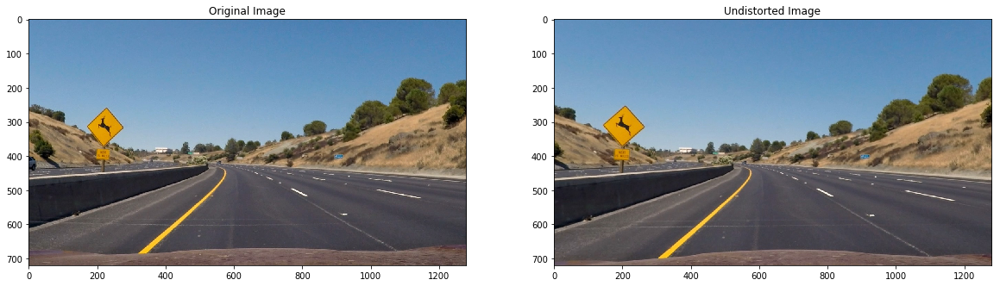

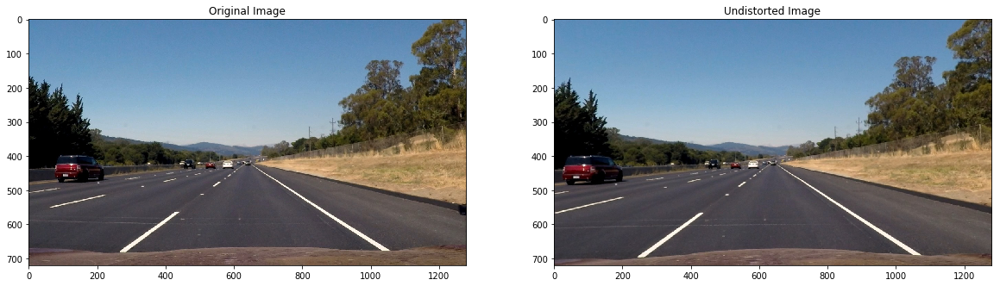

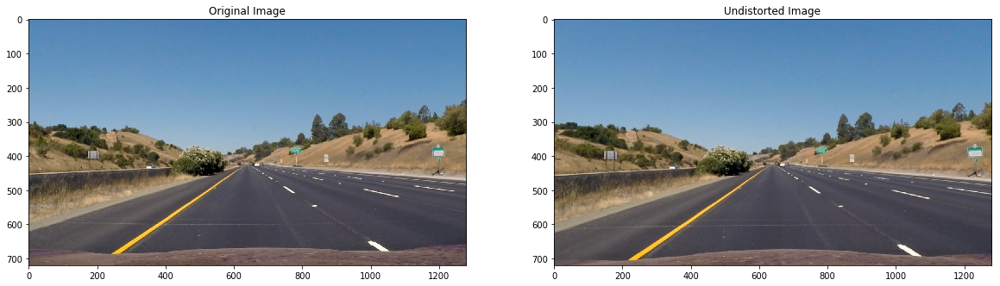

In [503]:
# get file name list
os.chdir(inputdir_image)
file_list_image = glob.glob('*' + file_extension)
os.chdir(currentdir)

for eachfile in file_list_image:
    img = mpimg.imread(f'{inputdir_image}/{eachfile}')
    undistorted = cal_undistort(img, objpoints, imgpoints)
    fig, ax1, ax2 = image_plot(img, undistorted, title_1='Original Image', title_2='Undistorted Image')
    plt.show()
    fig.savefig('{}/{}_undistorted{}'.format(outputdir_image, eachfile.split(file_extension)[0], file_extension))

# 2. Create thresholded binary images

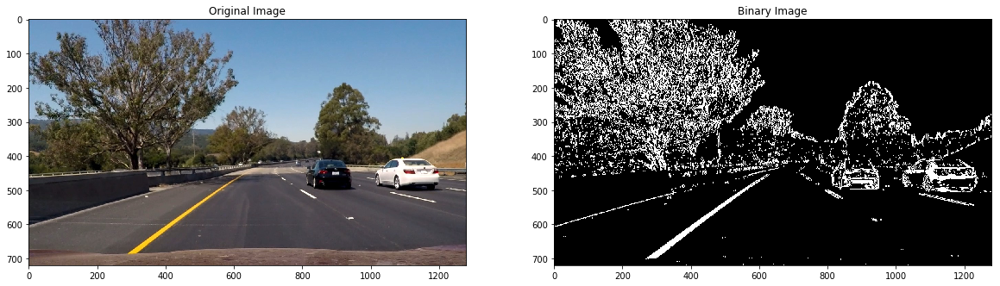

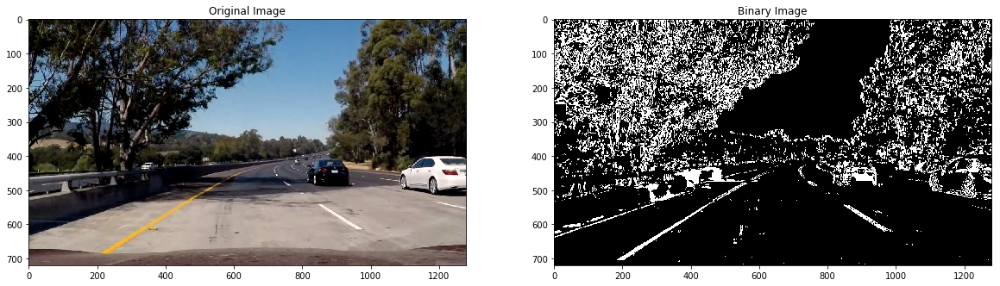

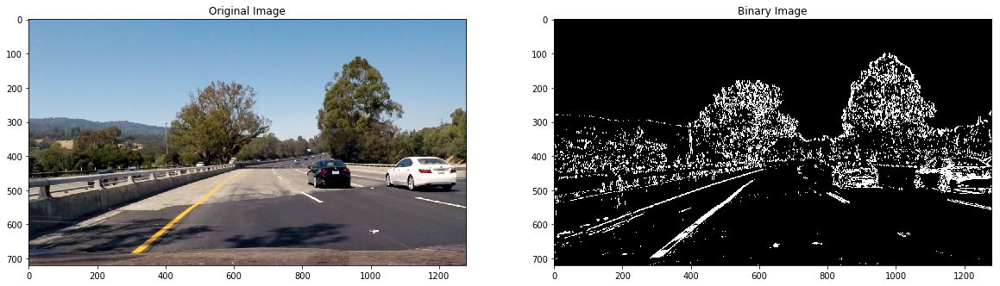

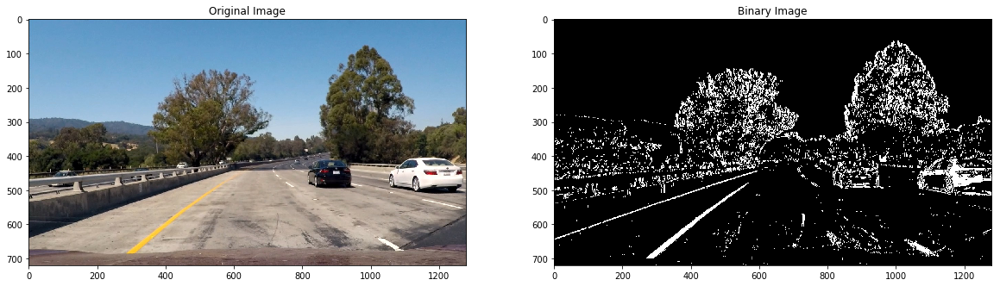

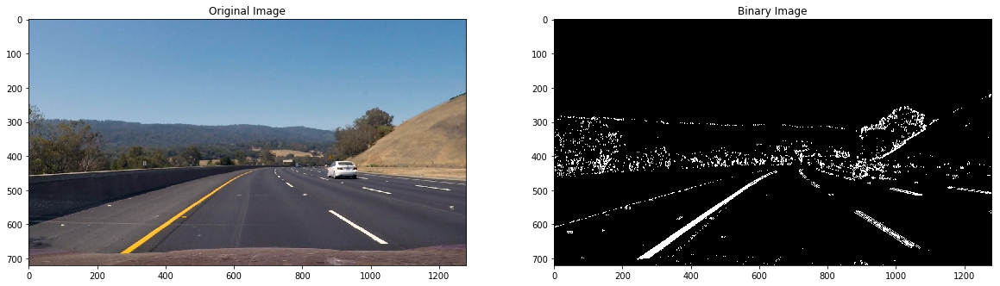

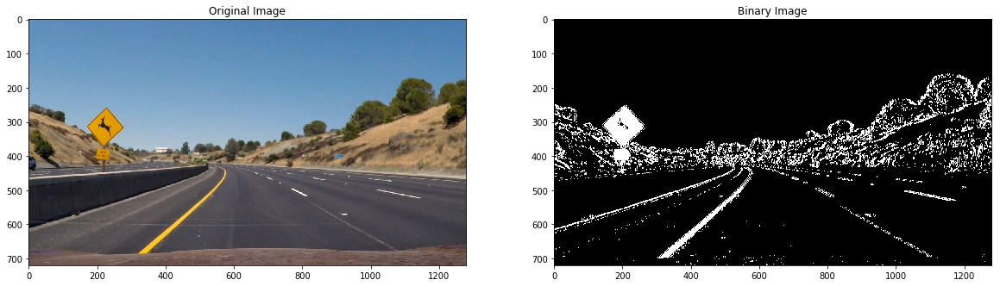

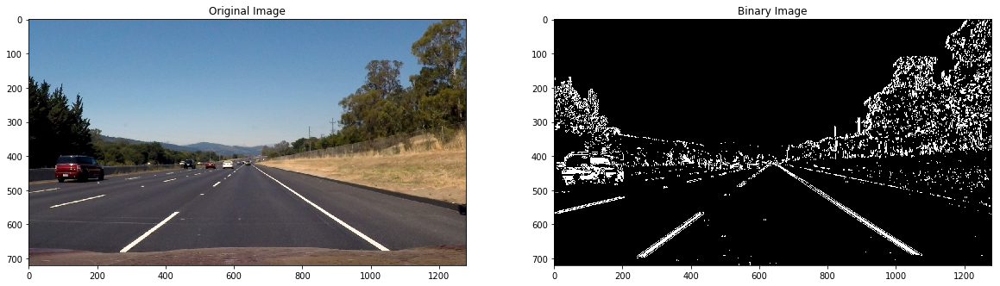

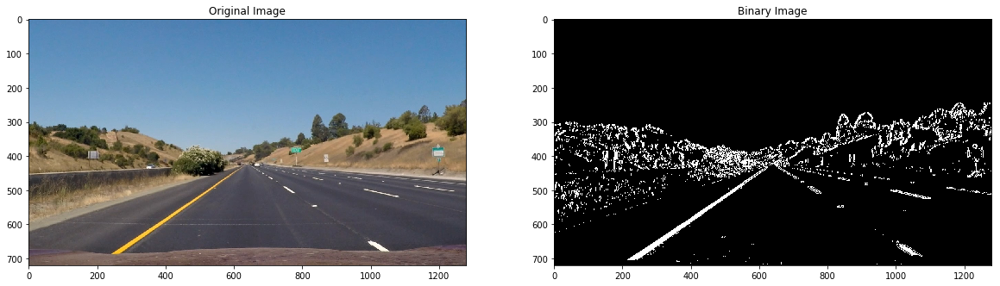

In [504]:
# Edit this function to create your own pipeline.
def gaussian_blur(img, kernel_size=5):
    """Applies a Gaussian Noise kernel"""
    return cv2.GaussianBlur(img, (kernel_size, kernel_size), 0)

def pipeline(img, s_thresh=(170, 255), sx_thresh=(20, 100)):
    img = np.copy(img)
    # Convert to HLS color space and separate the V channel
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    l_channel = hls[:,:,1]
    s_channel = hls[:,:,2]
    # Sobel x
    sobelx = cv2.Sobel(l_channel, cv2.CV_64F, 1, 0) # Take the derivative in x
    abs_sobelx = np.absolute(sobelx) # Absolute x derivative to accentuate lines away from horizontal
    scaled_sobel = np.uint8(255*abs_sobelx/np.max(abs_sobelx))

    # Threshold x gradient
    sxbinary = np.zeros_like(scaled_sobel)
    sxbinary[(scaled_sobel >= sx_thresh[0]) & (scaled_sobel <= sx_thresh[1])] = 1

    # Threshold color channel
    s_binary = np.zeros_like(s_channel)
    s_binary[(s_channel >= s_thresh[0]) & (s_channel <= s_thresh[1])] = 1

    # Stack each channel
    binary_image = np.zeros_like(sxbinary)
    binary_image[(sxbinary==1) | (s_binary==1)] = 1
    
    return binary_image

for eachfile in file_list_image:
    img = mpimg.imread(f'{inputdir_image}/{eachfile}')
    undistorted = cal_undistort(img, objpoints, imgpoints)
    undistorted_blur = gaussian_blur(undistorted)
    binary_image = pipeline(undistorted_blur)
    fig, ax1, ax2 = image_plot(img, binary_image, title_1='Original Image', title_2='Binary Image', cmap_2='gray')
    plt.show()
    fig.savefig('{}/{}_binary{}'.format(outputdir_image, eachfile.split(file_extension)[0], file_extension))

# 3. Perspective transform

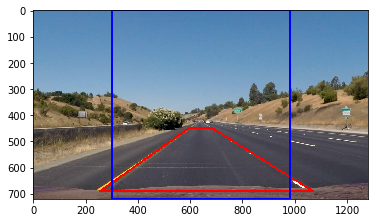

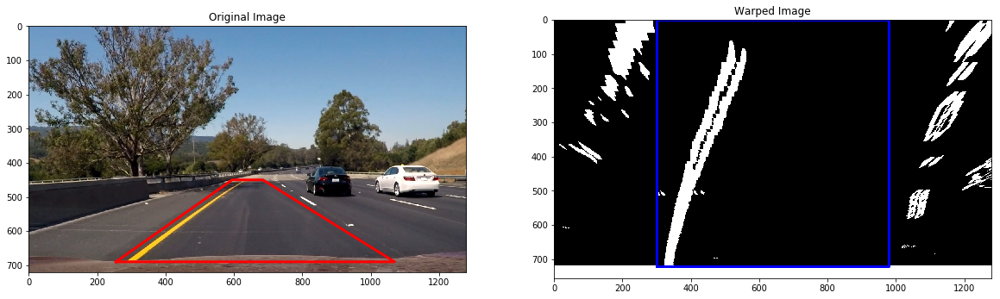

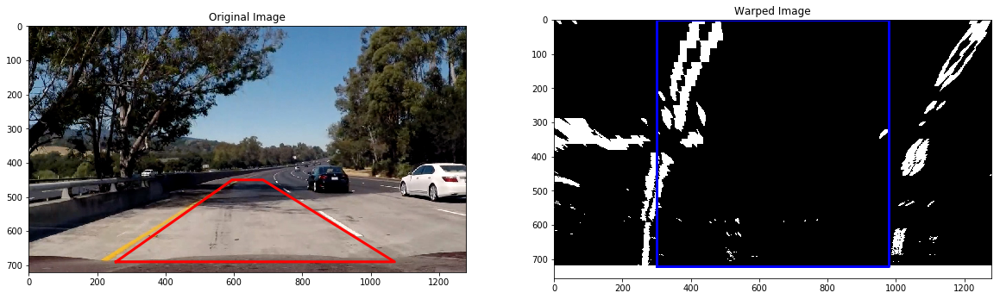

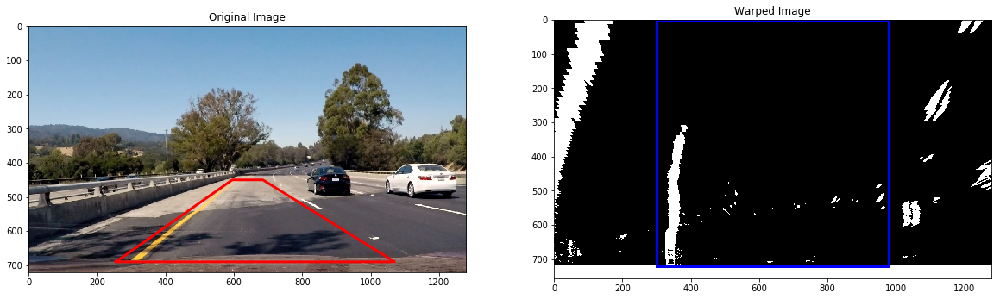

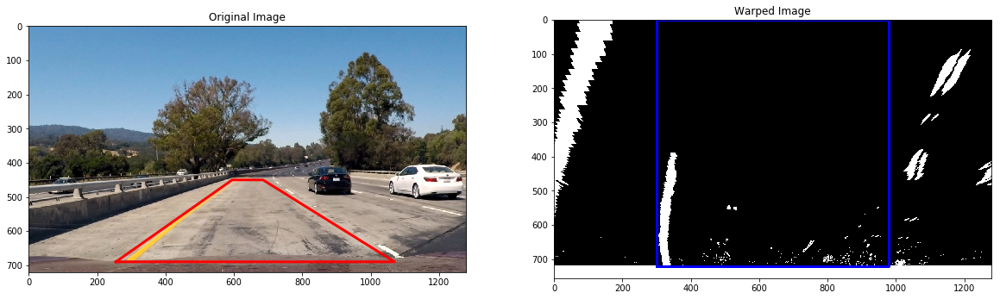

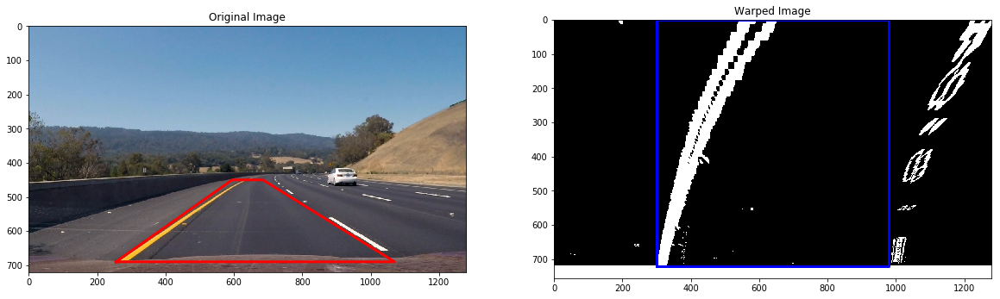

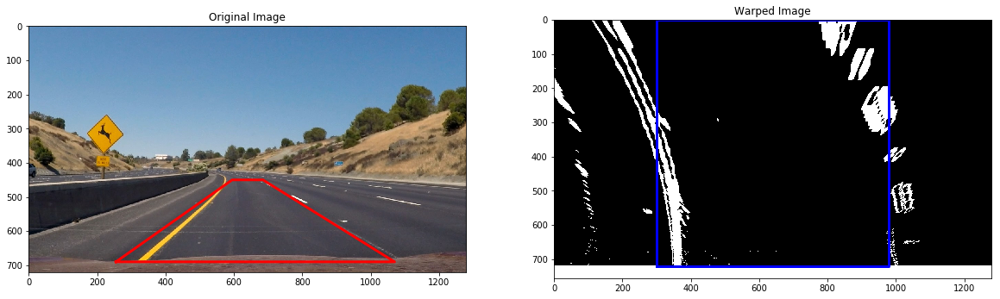

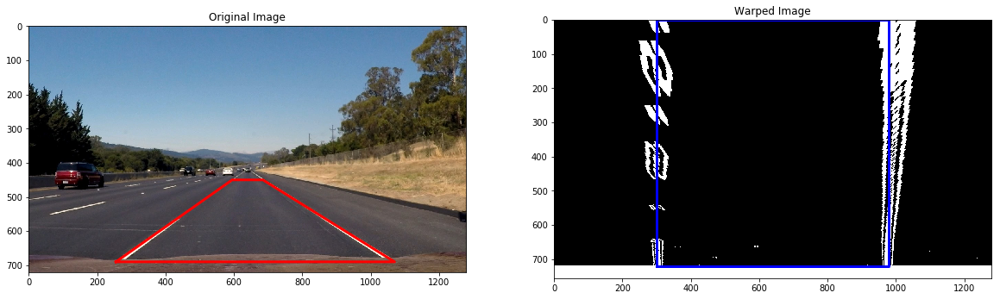

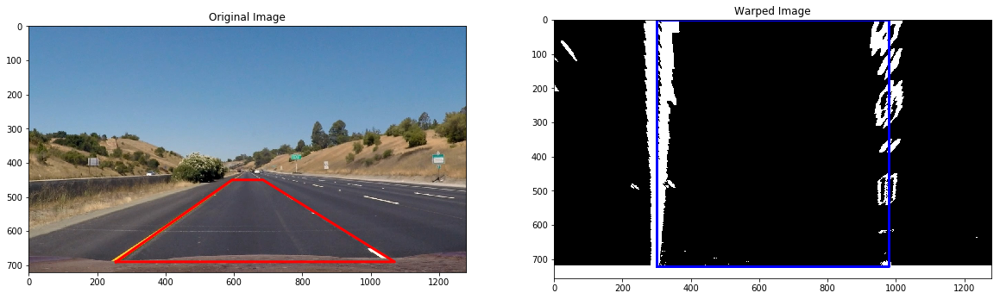

In [505]:
# pick straight line image 
img = mpimg.imread(f'{inputdir_image}/straight_lines1.jpg')
img_size = (img.shape[1], img.shape[0])

# define 4 source/destination points
src = np.array([(255, 690), (595, 450), (685, 450),(1070, 690)], dtype=np.int32)
dst = np.array([(300, 720), (300, 0), (980, 0),(980, 720)], dtype=np.int32)
cv2.polylines(img, [src], True, (255, 0, 0), thickness=5)
cv2.polylines(img, [dst], True, (0, 0, 255), thickness=5)
plt.imshow(img)

# for plotting
src_x = [src[0][0], src[1][0], src[2][0], src[3][0], src[0][0]]
src_y = [src[0][1], src[1][1], src[2][1], src[3][1], src[0][1]]
dst_x = [dst[0][0], dst[1][0], dst[2][0], dst[3][0], dst[0][0]]
dst_y = [dst[0][1], dst[1][1], dst[2][1], dst[3][1], dst[0][1]]

# get the transform matrix M/Minv
M = cv2.getPerspectiveTransform(np.float32(src), np.float32(dst))
M_inv = cv2.getPerspectiveTransform(np.float32(dst), np.float32(src))

for eachfile in file_list_image:
    img = mpimg.imread(f'{inputdir_image}/{eachfile}')
    img_size = (img.shape[1], img.shape[0])
    undistorted = cal_undistort(img, objpoints, imgpoints)
    undistorted_blur = gaussian_blur(undistorted)
    binary_image = pipeline(undistorted_blur)
    warped = cv2.warpPerspective(binary_image, M, img_size, flags=cv2.INTER_LINEAR)
    
    fig, ax1, ax2 = image_plot(img, warped, title_1='Original Image', title_2='Warped Image', cmap_2='gray')
    ax1.plot(src_x, src_y, color='red', linewidth=3)
    ax2.plot(dst_x, dst_y, color='blue', linewidth=3)
    plt.show()
    fig.savefig('{}/{}_warped{}'.format(outputdir_image, eachfile.split(file_extension)[0], file_extension))

# 4. Find lane-line pixels and fit their positions with a polynomial

3.638697448279759


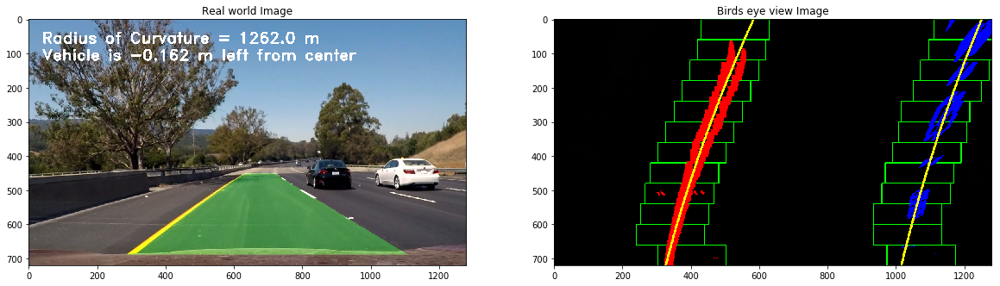

3.9234506893142385


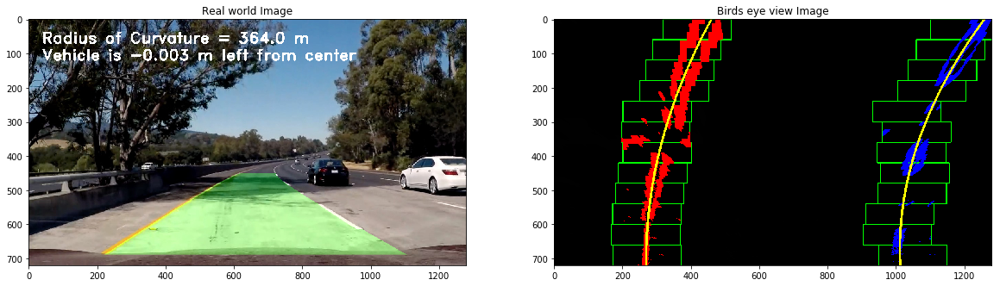

3.570763019631361


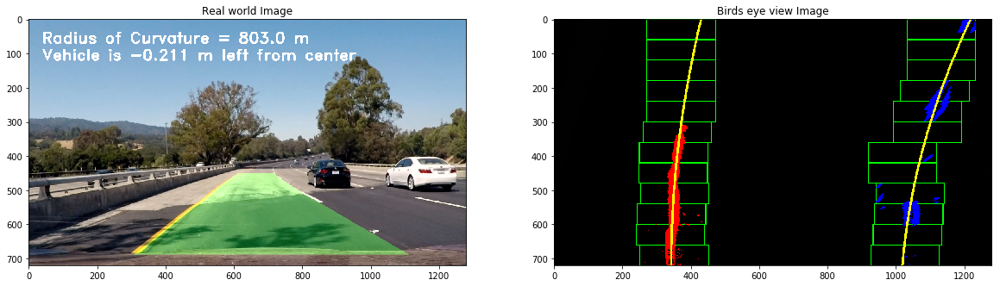

3.679596881681117


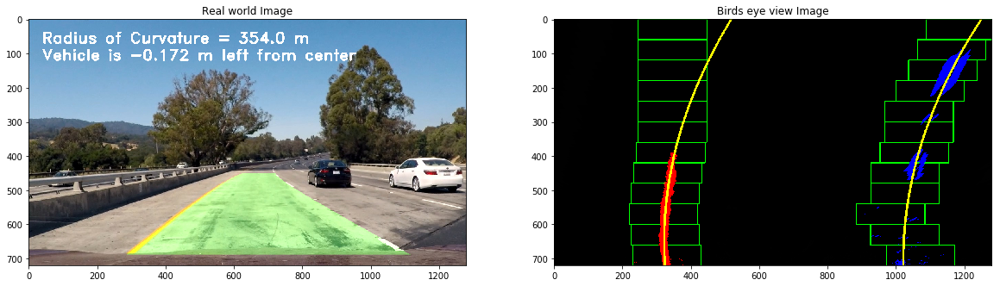

3.5677087169338337


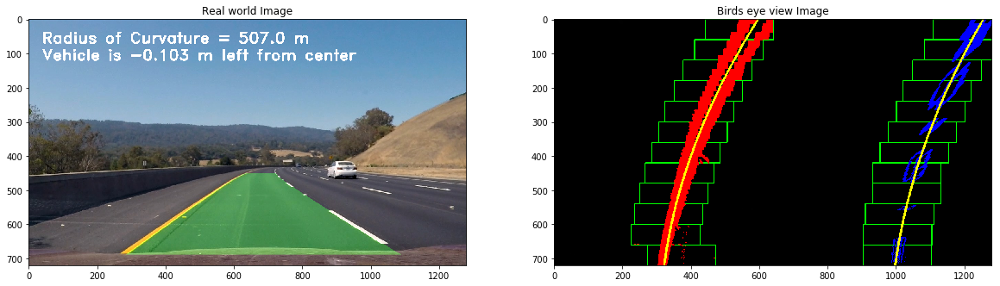

3.378592183442322


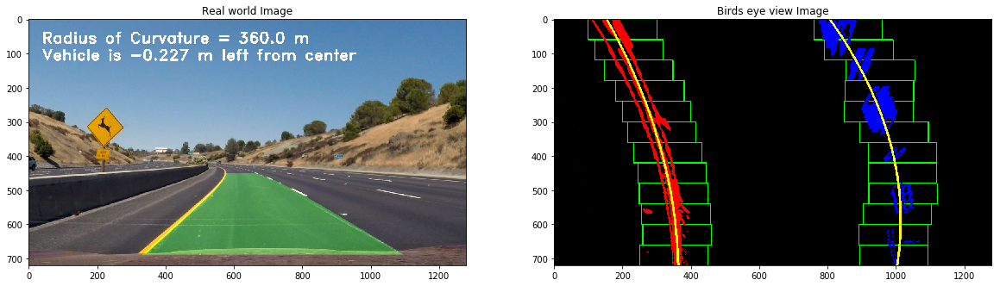

3.5224482030924857


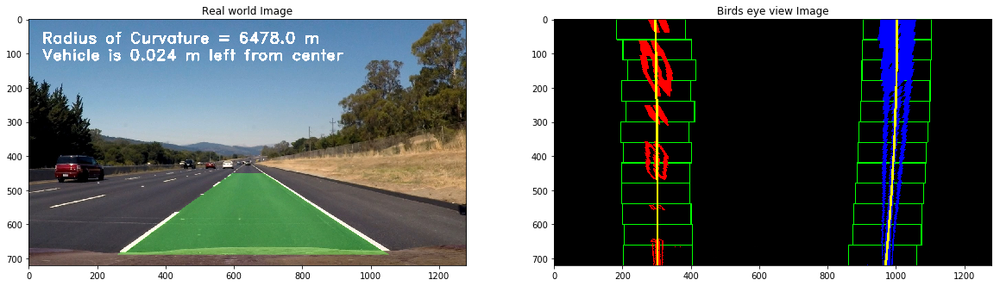

3.4959795097683193


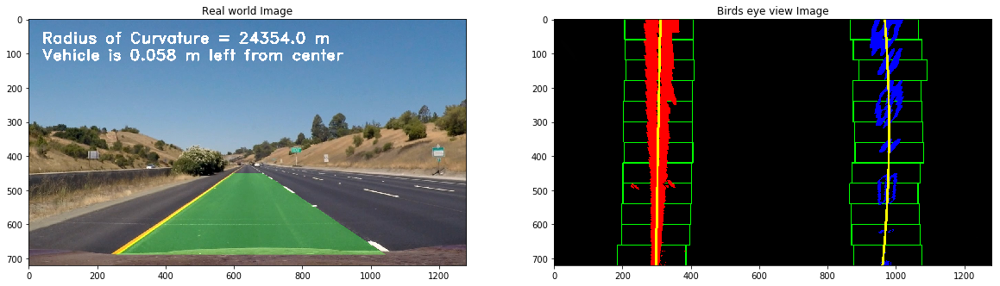

In [544]:
def region_of_interest(img, vertices):
    """
    Applies an image mask.
    
    Only keeps the region of the image defined by the polygon
    formed from `vertices`. The rest of the image is set to black.
    `vertices` should be a numpy array of integer points.
    """
    #defining a blank mask to start with
    mask = np.zeros_like(img)   
    
    #defining a 3 channel or 1 channel color to fill the mask with depending on the input image
    if len(img.shape) > 2:
        channel_count = img.shape[2]  # i.e. 3 or 4 depending on your image
        ignore_mask_color = (255,) * channel_count
    else:
        ignore_mask_color = 255
        
    #filling pixels inside the polygon defined by "vertices" with the fill color    
    cv2.fillPoly(mask, vertices, ignore_mask_color)
    
    #returning the image only where mask pixels are nonzero
    masked_image = cv2.bitwise_and(img, mask)
    return masked_image

def find_lane_pixels(binary_warped, nwindows=12, margin=100, minpix=50):
    # Take a histogram of the bottom half of the image
    histogram = np.sum(binary_warped[binary_warped.shape[0]//2:,:], axis=0)
    # Create an output image to draw on and visualize the result
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))
    # Find the peak of the left and right halves of the histogram
    # These will be the starting point for the left and right lines
    midpoint = np.int(histogram.shape[0]//2)
    leftx_base = np.argmax(histogram[:midpoint])
    rightx_base = np.argmax(histogram[midpoint:]) + midpoint

    # Set height of windows - based on nwindows above and image shape
    window_height = np.int(binary_warped.shape[0]//nwindows)
    # Identify the x and y positions of all nonzero pixels in the image
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    # Current positions to be updated later for each window in nwindows
    leftx_current = leftx_base
    rightx_current = rightx_base

    # Create empty lists to receive left and right lane pixel indices
    left_lane_inds = []
    right_lane_inds = []

    # Step through the windows one by one
    for window in range(nwindows):
        # Identify window boundaries in x and y (and right and left)
        win_y_low = binary_warped.shape[0] - (window+1)*window_height
        win_y_high = binary_warped.shape[0] - window*window_height
        win_xleft_low = leftx_current - margin
        win_xleft_high = leftx_current + margin
        win_xright_low = rightx_current - margin
        win_xright_high = rightx_current + margin
        
        # Draw the windows on the visualization image
        cv2.rectangle(out_img,(win_xleft_low,win_y_low), (win_xleft_high,win_y_high),(0,255,0), 2)
        cv2.rectangle(out_img,(win_xright_low,win_y_low), (win_xright_high,win_y_high),(0,255,0), 2)
        
        #　Identify the nonzero pixels in x and y within the window ###
        good_left_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xleft_low) &  (nonzerox < win_xleft_high)).nonzero()[0]
        good_right_inds = ((nonzeroy >= win_y_low) & (nonzeroy < win_y_high) & 
        (nonzerox >= win_xright_low) &  (nonzerox < win_xright_high)).nonzero()[0]

        # Append these indices to the lists
        left_lane_inds.append(good_left_inds)
        right_lane_inds.append(good_right_inds)
        
        #　If you found > minpix pixels, recenter next window ###
        if len(good_left_inds) > minpix:
            leftx_current = np.int(np.mean(nonzerox[good_left_inds]))
        if len(good_right_inds) > minpix:        
            rightx_current = np.int(np.mean(nonzerox[good_right_inds]))

    # Concatenate the arrays of indices (previously was a list of lists of pixels)
    try:
        left_lane_inds = np.concatenate(left_lane_inds)
        right_lane_inds = np.concatenate(right_lane_inds)
    except ValueError:
        # Avoids an error if the above is not implemented fully
        pass

    # Extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]

    return leftx, lefty, rightx, righty, out_img


def fit_polynomial(binary_warped, line_class=None):
    # Find our lane pixels first
    if line == None:
        leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    else:
        try:
            if line_class.detected.getIndexValue(-1) == 1:
                left_fit_pre = line_class.poly_fit_left_ave
                right_fit_pre = line_class.poly_fit_right_ave
                leftx, lefty, rightx, righty, out_img = search_around_poly(binary_warped,  left_fit_pre, right_fit_pre)
            else:
                leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
        except:
            leftx, lefty, rightx, righty, out_img = find_lane_pixels(binary_warped)
    
    # Fit a second order polynomial to each 
    left_fit = np.polyfit(lefty, leftx, 2)
    right_fit = np.polyfit(righty, rightx, 2)
    
    # Fit a second order polynomial to each in real world
    left_fit_cr = np.polyfit(lefty*ym_per_pix, leftx*xm_per_pix, 2)
    right_fit_cr = np.polyfit(righty*ym_per_pix, rightx*xm_per_pix, 2)
        
    # Generate x and y values for plotting
    ploty = np.linspace(0, binary_warped.shape[0]-1, binary_warped.shape[0] )
    try:
        left_fitx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
        right_fitx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]
    except TypeError:
        # Avoids an error if `left` and `right_fit` are still none or incorrect
        print('The function failed to fit a line!')
        left_fitx = 1*ploty**2 + 1*ploty
        right_fitx = 1*ploty**2 + 1*ploty

    ## Visualization ##
    # Colors in the left and right lane regions
    out_img[lefty, leftx] = [255, 0, 0]
    out_img[righty, rightx] = [0, 0, 255]

    # Plots the left and right polynomials on the lane lines
    left_line = np.array([np.transpose(np.vstack([left_fitx, ploty]))], dtype=np.int32)
    right_line = np.array([np.transpose(np.vstack([right_fitx, ploty]))], dtype=np.int32)
    cv2.polylines(out_img, left_line, isClosed=False, color=(255, 255,0), thickness=5)
    cv2.polylines(out_img, right_line, isClosed=False, color=(255, 255,0), thickness=5)

    return out_img, left_fit, right_fit, left_fit_cr, right_fit_cr


def measure_curvature_and_offset(x_eval, y_eval, left_fit, right_fit):
    # calculate left/right line curve radius
    left_curverad =  ((1 + (2*left_fit[0]*y_eval*ym_per_pix + left_fit[1])**2)**(3/2))/np.abs(2*left_fit[0])
    right_curverad =  ((1 + (2*right_fit[0]*y_eval*ym_per_pix + right_fit[1])**2)**(3/2))/np.abs(2*right_fit[0])
    
    # calculate left/right line lateral position
    left_line_pos = left_fit[0]*(y_eval*ym_per_pix)**2 + left_fit[1]*y_eval*ym_per_pix + left_fit[2]
    right_line_pos = right_fit[0]*(y_eval*ym_per_pix)**2 + right_fit[1]*y_eval*ym_per_pix + right_fit[2]
    
    # calculate curve dadius & ego offset from the lane center
    curverad = np.mean([left_curverad, right_curverad])
    ego_offset = x_eval*xm_per_pix - np.mean([left_line_pos, right_line_pos])
    lane_width = right_line_pos - left_line_pos
    return curverad, ego_offset, lane_width


def put_text(img, curverad, ego_offset, color=[255,255,255], fontType = cv2.FONT_HERSHEY_DUPLEX, thickness=4):
    """Put the text on the image"""
    text1 = 'Radius of Curvature = {} m'.format(round(curverad))
    text2 = 'Vehicle is {} m left from center'.format(round(ego_offset, 3)) 
    cv2.putText(img, text1, (40,70), fontType, 1.5, [255,255,255], thickness)
    cv2.putText(img, text2, (40,120), fontType, 1.5, [255,255,255], thickness)
    
    return img

def project_lanes(img_text, binary_image, left_fit, right_fit, M_inv):

    warped = np.zeros_like(binary_image).astype(np.uint8)
    warped_color = np.dstack((warped, warped, warped))
    
    ploty = np.linspace(0, binary_image.shape[0]-1, binary_image.shape[0])
    leftx = left_fit[0]*ploty**2 + left_fit[1]*ploty + left_fit[2]
    rightx = right_fit[0]*ploty**2 + right_fit[1]*ploty + right_fit[2]

    # create the position array to draw the lane
    left_line = np.array([np.transpose(np.vstack([leftx, ploty]))], dtype=np.int32)
    right_line = np.array([np.flipud(np.transpose(np.vstack([rightx, ploty])))], dtype=np.int32)
    trapezoid = np.hstack((left_line, right_line))

    # Draw the lane on blank warped image
    cv2.fillPoly(warped_color, trapezoid, (0,255, 0))

    # Project the lane using inverse perspective matrix (M_inv)
    real = cv2.warpPerspective(warped_color, M_inv, (binary_image.shape[1], binary_image.shape[0])) 
    result = cv2.addWeighted(img_text, 1, real, 0.3, 0)
    
    return result

# region of interest
vertices = np.array([[(0, imshape[0]),
                      (int(imshape[1]*0.45), int(imshape[0]*0.6)),
                      (int(imshape[1]*0.55), int(imshape[0]*0.6)),
                      (imshape[1], imshape[0])]], dtype=np.int32)

for eachfile in file_list_image:
    img = mpimg.imread(f'{inputdir_image}/{eachfile}')
    undistorted = cal_undistort(img, objpoints, imgpoints)
    undistorted_blur = gaussian_blur(undistorted)
    binary_image = pipeline(undistorted_blur)
    masked_image = region_of_interest(binary_image, vertices)
    warped = cv2.warpPerspective(binary_image, M, img_size, flags=cv2.INTER_LINEAR)
    
    out_img, left_fit, right_fit, left_fit_cr, right_fit_cr = fit_polynomial(warped)
    # calculate curve radius & ego offset from the lane center
    curverad, ego_offset, lane_width = measure_curvature_and_offset(binary_image.shape[1]//2, binary_image.shape[0], left_fit_cr, right_fit_cr)
    print(lane_width)
    
    img_text = put_text(np.copy(img), curverad, ego_offset)
    img_projected = project_lanes(img_text, binary_image, left_fit, right_fit, M_inv)
    
    fig, ax1, ax2 = image_plot(img_projected, out_img, title_1='Real world Image', title_2='Birds eye view Image')
    plt.show()
    fig.savefig('{}/{}_poly{}'.format(outputdir_image, eachfile.split(file_extension)[0], file_extension))

# 5. Test on video

In [545]:
frame_num = 5

# Ring buffer for scalar
class RingBuffer:
    def __init__(self, x, size):
        self.data = [x for i in range(size)]

    def append(self, x):
        self.data.pop(0)
        self.data.append(x)

    def get(self):
        return self.data

    def getIndexValue(self, index):
        return self.data[index]

    
# Ring buffer for array
class RingBuffer_array:
    def __init__(self, x, size):
        tmp = np.array(x)
        temp = tmp
        for i in range(size-1):
            temp = np.dstack((temp, tmp))
        self.data = temp
        
    def append(self, x):
        self.data = np.delete(self.data, 0, 2)
        self.data = np.dstack((self.data, x))

    def get(self):
        return self.data

    def getIndexValue(self, index):
        return self.data[:, :, index]

    
# Define a class to receive the characteristics of each line detection
class Line():
    def __init__(self):
        # the line detection history in the last few iteration
        self.detected = RingBuffer(0, frame_num)
        # left line polynomial coefficients of the last n cycle
        self.poly_fit_left = RingBuffer_array(np.zeros(3), frame_num)
        # right line polynomial coefficients of the last n cycle
        self.poly_fit_right = RingBuffer_array(np.zeros(3), frame_num)
        # left line polynomial coefficients averaged over the last n iterations
        self.poly_fit_left_ave = np.zeros(3)
        # right line polynomial coefficients averaged over the last n iterations
        self.poly_fit_right_ave = np.zeros(3)
        #　radius of curvature of the line in some units
        self.curverad_hist = RingBuffer(10000, frame_num)
        #　distance in meters of vehicle center from the line
        self.ego_offset_hist = RingBuffer(0, frame_num)
        #　distance in meters of lane width
        self.lane_width_hist = RingBuffer(0, frame_num)
        #　current frame num
        self.current_frame = 0
        
        
def search_around_poly(binary_warped, left_fit, right_fit, margin=60):

    # Grab activated pixels
    nonzero = binary_warped.nonzero()
    nonzeroy = np.array(nonzero[0])
    nonzerox = np.array(nonzero[1])
    
    ### within the +/- margin of our polynomial function ###
    ### Hint: consider the window areas for the similarly named variables ###
    ### in the previous quiz, but change the windows to our new search area ###
    Left_line = left_fit[0]*nonzeroy**2 + left_fit[1]*nonzeroy + left_fit[2]
    Right_line = right_fit[0]*nonzeroy**2 + right_fit[1]*nonzeroy + right_fit[2]
    left_lane_inds = ((nonzerox >= (Left_line - margin)) & (nonzerox < (Left_line + margin))).nonzero()[0]
    right_lane_inds = ((nonzerox >= (Right_line - margin)) & (nonzerox < (Right_line + margin))).nonzero()[0]
    
    # Again, extract left and right line pixel positions
    leftx = nonzerox[left_lane_inds]
    lefty = nonzeroy[left_lane_inds] 
    rightx = nonzerox[right_lane_inds]
    righty = nonzeroy[right_lane_inds]
        
    # Create an image to draw on and an image to show the selection window
    out_img = np.dstack((binary_warped, binary_warped, binary_warped))*255
    
    return leftx, lefty, rightx, righty, out_img


def process_image(img):

    undistorted = cal_undistort(img, objpoints, imgpoints)
    undistorted_blur = gaussian_blur(undistorted)
    binary_image = pipeline(undistorted_blur)
    masked_image = region_of_interest(binary_image, vertices)
    warped = cv2.warpPerspective(binary_image, M, img_size, flags=cv2.INTER_LINEAR)
    out_img, left_fit, right_fit, left_fit_cr, right_fit_cr  = fit_polynomial(warped, line_class=line)
    # calculate curve radius & ego offset from the lane center
    curverad, ego_offset, lane_width = measure_curvature_and_offset(binary_image.shape[1]//2, binary_image.shape[0], left_fit_cr, right_fit_cr)
    
    # Sanity Check
    curverad_diff = abs(curverad - line.curverad_hist.getIndexValue(-1))
    ego_offset_diff = abs(ego_offset - line.ego_offset_hist.getIndexValue(-1))
    detection_status_check = line.detected.getIndexValue(-1) == 1
    curverad_check = curverad_diff > 1000
    ego_offset_check = ego_offset_diff > 0.1
    lane_width_check = lane_width > 4.2 or lane_width < 2.5

    if detection_status_check and (curverad_check or ego_offset_check or lane_width_check):
        line.detected.append(0)
        line.poly_fit_left.append(np.zeros(3))
        line.poly_fit_right.append(np.zeros(3))
        line.curverad_hist.append(0)
        line.ego_offset_hist.append(0)
        line.lane_width_hist.append(0)
        num = max(np.sum(line.detected.get()), 1)
        curverad_disp = np.sum(line.curverad_hist.get())/num
        ego_offset_disp = np.sum(line.ego_offset_hist.get())/num
        line.current_frame += 1
    else:
        line.detected.append(1)
        line.poly_fit_left.append(left_fit)
        line.poly_fit_right.append(right_fit)
        line.curverad_hist.append(curverad)
        line.ego_offset_hist.append(ego_offset)
        line.lane_width_hist.append(lane_width)
        num = max(np.sum(line.detected.get()), 1)
        curverad_disp = np.sum(line.curverad_hist.get())/num
        ego_offset_disp = np.sum(line.ego_offset_hist.get())/num
        line.poly_fit_left_ave = np.sum(line.poly_fit_left.get(), axis=2)[0,:]/num
        line.poly_fit_right_ave = np.sum(line.poly_fit_right.get(), axis=2)[0,:]/num
        line.current_frame += 1
        
    img_text = put_text(np.copy(img), curverad_disp, ego_offset_disp)
    img_projected = project_lanes(img_text, binary_image, line.poly_fit_left_ave, line.poly_fit_right_ave, M_inv)

    return img_projected

In [552]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML

video_name = 'project_video'
video_in = video_name + video_extension
video_out = outputdir_video + '/' + video_name + '_output' + video_extension

line = Line()
clip1 = VideoFileClip(video_in)
clip = clip1.fl_image(process_image)
%time clip.write_videofile(video_out, audio=False)

t:  28%|██▊       | 136/485 [6:08:06<01:05,  5.31it/s, now=None]

































t:   0%|          | 3/1260 [4:59:11<03:11,  6.56it/s, now=None]










































t:   5%|▌         | 67/1260 [4:31:50<04:03,  4.91it/s, now=None]





t:   0%|          | 1/1260 [22:12:16<27955:37:41, 79936.67s/it, now=None]
















t:  24%|██▍       | 308/1260 [16:25:37<03:09,  5.02it/s, now=None]



















t:  79%|███████▉  | 383/485 [6:37:49<00:20,  4.93it/s, now=None]



























t:  28%|██▊       | 136/485 [5:52:34<01:13,  4.73it/s, now=None]





























t:   0%|          | 3/1260 [5:06:53<02:57,  7.06it/s, now=None]






























t:   0%|          | 3/1260 [5:02:17<03:05,  6.76it/s, now=None]
































t:   0%|          | 3/1260 [5:00:43<02:59,  7.01it/s, now=None]












































t:   5%|▌         | 67/1260 [4:27:43<04:02,  4.92it/s, now=None]



Moviepy - Building video ./output_video/project_video_output.mp4.
Moviepy - Writing video ./output_video/project_video_output.mp4




















t:  24%|██▍       | 308/1260 [16:25:38<03:09,  5.02it/s, now=None]



















t:  79%|███████▉  | 383/485 [6:37:49<00:20,  4.93it/s, now=None]



























t:  28%|██▊       | 136/485 [5:52:35<01:13,  4.73it/s, now=None]





























t:   0%|          | 3/1260 [5:06:54<02:57,  7.06it/s, now=None]






























t:   0%|          | 3/1260 [5:02:17<03:05,  6.76it/s, now=None]
































t:   0%|          | 3/1260 [5:00:44<02:59,  7.01it/s, now=None]












































t:   5%|▌         | 67/1260 [4:27:44<04:02,  4.92it/s, now=None]













































t:   7%|▋         | 82/1260 [4:22:46<04:13,  4.64it/s, now=None]







t:   0%|          | 1/1260 [22:10:44<27923:13:56, 79844.03s/it, now=None]




























t:   0%|          | 1/1260 [5:07:27<6451:40:14, 18447.99s/it, now=None]


































t:   0%|          | 3/1

t:   1%|          | 8/1260 [00:01<03:57,  5.28it/s, now=None]



















































t:   1%|          | 9/1260 [00:01<03:58,  5.25it/s, now=None]



















































t:   1%|          | 10/1260 [00:01<04:00,  5.19it/s, now=None]



















































t:   1%|          | 11/1260 [00:02<04:02,  5.16it/s, now=None]



















































t:   1%|          | 12/1260 [00:02<04:03,  5.12it/s, now=None]



















































t:   1%|          | 13/1260 [00:02<04:17,  4.85it/s, now=None]



















































t:   1%|          | 14/1260 [00:02<04:22,  4.75it/s, now=None]



















































t:   1%|          | 15/1260 [00:02<04:25,  4.70it/s, now=None]



















































t:   1%|▏         | 16/1260 [00:03<04:25,  4.69it/s, now=None]





























t:   3%|▎         | 38/1260 [00:07<04:11,  4.86it/s, now=None]



















































t:   3%|▎         | 39/1260 [00:07<04:34,  4.45it/s, now=None]



















































t:   3%|▎         | 40/1260 [00:08<04:28,  4.54it/s, now=None]



















































t:   3%|▎         | 41/1260 [00:08<04:24,  4.61it/s, now=None]



















































t:   3%|▎         | 42/1260 [00:08<04:24,  4.60it/s, now=None]



















































t:   3%|▎         | 43/1260 [00:08<04:18,  4.71it/s, now=None]



















































t:   3%|▎         | 44/1260 [00:08<04:19,  4.68it/s, now=None]



















































t:   4%|▎         | 45/1260 [00:09<04:18,  4.69it/s, now=None]



















































t:   4%|▎         | 46/1260 [00:09<04:15,  4.75it/s, now=None]



























t:   5%|▌         | 68/1260 [00:13<03:53,  5.11it/s, now=None]



















































t:   5%|▌         | 69/1260 [00:13<03:52,  5.12it/s, now=None]



















































t:   6%|▌         | 70/1260 [00:14<03:52,  5.12it/s, now=None]



















































t:   6%|▌         | 71/1260 [00:14<03:51,  5.14it/s, now=None]



















































t:   6%|▌         | 72/1260 [00:14<03:52,  5.12it/s, now=None]



















































t:   6%|▌         | 73/1260 [00:14<03:51,  5.13it/s, now=None]



















































t:   6%|▌         | 74/1260 [00:14<03:51,  5.13it/s, now=None]



















































t:   6%|▌         | 75/1260 [00:15<03:52,  5.11it/s, now=None]



















































t:   6%|▌         | 76/1260 [00:15<03:50,  5.13it/s, now=None]



























t:   8%|▊         | 98/1260 [00:19<03:46,  5.12it/s, now=None]



















































t:   8%|▊         | 99/1260 [00:19<03:46,  5.12it/s, now=None]



















































t:   8%|▊         | 100/1260 [00:19<03:45,  5.14it/s, now=None]



















































t:   8%|▊         | 101/1260 [00:20<03:45,  5.14it/s, now=None]



















































t:   8%|▊         | 102/1260 [00:20<03:47,  5.09it/s, now=None]



















































t:   8%|▊         | 103/1260 [00:20<03:46,  5.11it/s, now=None]



















































t:   8%|▊         | 104/1260 [00:20<03:48,  5.07it/s, now=None]



















































t:   8%|▊         | 105/1260 [00:20<03:46,  5.10it/s, now=None]



















































t:   8%|▊         | 106/1260 [00:21<03:45,  5.12it/s, now=None]




















t:  10%|█         | 128/1260 [00:25<03:38,  5.17it/s, now=None]



















































t:  10%|█         | 129/1260 [00:25<03:39,  5.16it/s, now=None]



















































t:  10%|█         | 130/1260 [00:25<03:39,  5.16it/s, now=None]



















































t:  10%|█         | 131/1260 [00:25<03:38,  5.16it/s, now=None]



















































t:  10%|█         | 132/1260 [00:26<03:38,  5.17it/s, now=None]



















































t:  11%|█         | 133/1260 [00:26<03:38,  5.16it/s, now=None]



















































t:  11%|█         | 134/1260 [00:26<03:39,  5.14it/s, now=None]



















































t:  11%|█         | 135/1260 [00:26<03:38,  5.14it/s, now=None]



















































t:  11%|█         | 136/1260 [00:26<03:43,  5.03it/s, now=None]


















t:  13%|█▎        | 158/1260 [00:31<03:34,  5.14it/s, now=None]



















































t:  13%|█▎        | 159/1260 [00:31<03:33,  5.15it/s, now=None]



















































t:  13%|█▎        | 160/1260 [00:31<03:35,  5.11it/s, now=None]



















































t:  13%|█▎        | 161/1260 [00:31<03:35,  5.10it/s, now=None]



















































t:  13%|█▎        | 162/1260 [00:31<03:34,  5.12it/s, now=None]



















































t:  13%|█▎        | 163/1260 [00:32<03:34,  5.12it/s, now=None]



















































t:  13%|█▎        | 164/1260 [00:32<03:33,  5.14it/s, now=None]



















































t:  13%|█▎        | 165/1260 [00:32<03:34,  5.10it/s, now=None]



















































t:  13%|█▎        | 166/1260 [00:32<03:35,  5.09it/s, now=None]


















t:  15%|█▍        | 188/1260 [00:37<03:30,  5.08it/s, now=None]



















































t:  15%|█▌        | 189/1260 [00:37<03:31,  5.06it/s, now=None]



















































t:  15%|█▌        | 190/1260 [00:37<03:29,  5.11it/s, now=None]



















































t:  15%|█▌        | 191/1260 [00:37<03:29,  5.10it/s, now=None]



















































t:  15%|█▌        | 192/1260 [00:37<03:28,  5.11it/s, now=None]



















































t:  15%|█▌        | 193/1260 [00:38<03:32,  5.03it/s, now=None]



















































t:  15%|█▌        | 194/1260 [00:38<03:30,  5.06it/s, now=None]



















































t:  15%|█▌        | 195/1260 [00:38<03:29,  5.09it/s, now=None]



















































t:  16%|█▌        | 196/1260 [00:38<03:28,  5.10it/s, now=None]


















t:  17%|█▋        | 218/1260 [00:42<03:22,  5.14it/s, now=None]



















































t:  17%|█▋        | 219/1260 [00:43<03:22,  5.14it/s, now=None]



















































t:  17%|█▋        | 220/1260 [00:43<03:22,  5.14it/s, now=None]



















































t:  18%|█▊        | 221/1260 [00:43<03:23,  5.12it/s, now=None]



















































t:  18%|█▊        | 222/1260 [00:43<03:23,  5.11it/s, now=None]



















































t:  18%|█▊        | 223/1260 [00:43<03:22,  5.12it/s, now=None]



















































t:  18%|█▊        | 224/1260 [00:44<03:22,  5.12it/s, now=None]



















































t:  18%|█▊        | 225/1260 [00:44<03:23,  5.07it/s, now=None]



















































t:  18%|█▊        | 226/1260 [00:44<03:24,  5.06it/s, now=None]


















t:  20%|█▉        | 248/1260 [00:48<03:18,  5.09it/s, now=None]



















































t:  20%|█▉        | 249/1260 [00:48<03:18,  5.09it/s, now=None]



















































t:  20%|█▉        | 250/1260 [00:49<03:17,  5.10it/s, now=None]



















































t:  20%|█▉        | 251/1260 [00:49<03:22,  4.99it/s, now=None]



















































t:  20%|██        | 252/1260 [00:49<03:28,  4.83it/s, now=None]



















































t:  20%|██        | 253/1260 [00:49<03:27,  4.86it/s, now=None]



















































t:  20%|██        | 254/1260 [00:50<03:23,  4.94it/s, now=None]



















































t:  20%|██        | 255/1260 [00:50<03:23,  4.95it/s, now=None]



















































t:  20%|██        | 256/1260 [00:50<03:22,  4.97it/s, now=None]


















t:  22%|██▏       | 278/1260 [00:54<03:12,  5.09it/s, now=None]



















































t:  22%|██▏       | 279/1260 [00:54<03:12,  5.11it/s, now=None]



















































t:  22%|██▏       | 280/1260 [00:55<03:12,  5.09it/s, now=None]



















































t:  22%|██▏       | 281/1260 [00:55<03:12,  5.08it/s, now=None]



















































t:  22%|██▏       | 282/1260 [00:55<03:13,  5.06it/s, now=None]



















































t:  22%|██▏       | 283/1260 [00:55<03:12,  5.08it/s, now=None]



















































t:  23%|██▎       | 284/1260 [00:55<03:12,  5.07it/s, now=None]



















































t:  23%|██▎       | 285/1260 [00:56<03:11,  5.08it/s, now=None]



















































t:  23%|██▎       | 286/1260 [00:56<03:10,  5.10it/s, now=None]


















t:  24%|██▍       | 308/1260 [01:00<03:12,  4.94it/s, now=None]



















































t:  25%|██▍       | 309/1260 [01:00<03:14,  4.89it/s, now=None]



















































t:  25%|██▍       | 310/1260 [01:01<03:15,  4.85it/s, now=None]



















































t:  25%|██▍       | 311/1260 [01:01<03:15,  4.84it/s, now=None]



















































t:  25%|██▍       | 312/1260 [01:01<03:16,  4.83it/s, now=None]



















































t:  25%|██▍       | 313/1260 [01:01<03:18,  4.78it/s, now=None]



















































t:  25%|██▍       | 314/1260 [01:01<03:15,  4.85it/s, now=None]



















































t:  25%|██▌       | 315/1260 [01:02<03:12,  4.91it/s, now=None]



















































t:  25%|██▌       | 316/1260 [01:02<03:12,  4.91it/s, now=None]


















t:  27%|██▋       | 338/1260 [01:07<03:23,  4.53it/s, now=None]



















































t:  27%|██▋       | 339/1260 [01:07<03:27,  4.43it/s, now=None]



















































t:  27%|██▋       | 340/1260 [01:07<03:30,  4.37it/s, now=None]



















































t:  27%|██▋       | 341/1260 [01:07<03:26,  4.45it/s, now=None]



















































t:  27%|██▋       | 342/1260 [01:07<03:24,  4.49it/s, now=None]



















































t:  27%|██▋       | 343/1260 [01:08<03:43,  4.09it/s, now=None]



















































t:  27%|██▋       | 344/1260 [01:08<03:43,  4.09it/s, now=None]



















































t:  27%|██▋       | 345/1260 [01:08<03:32,  4.30it/s, now=None]



















































t:  27%|██▋       | 346/1260 [01:08<03:26,  4.43it/s, now=None]


















t:  29%|██▉       | 368/1260 [01:13<03:04,  4.82it/s, now=None]



















































t:  29%|██▉       | 369/1260 [01:13<03:08,  4.72it/s, now=None]



















































t:  29%|██▉       | 370/1260 [01:13<03:09,  4.70it/s, now=None]



















































t:  29%|██▉       | 371/1260 [01:14<03:06,  4.77it/s, now=None]



















































t:  30%|██▉       | 372/1260 [01:14<03:04,  4.81it/s, now=None]



















































t:  30%|██▉       | 373/1260 [01:14<03:03,  4.84it/s, now=None]



















































t:  30%|██▉       | 374/1260 [01:14<03:05,  4.79it/s, now=None]



















































t:  30%|██▉       | 375/1260 [01:14<03:05,  4.76it/s, now=None]



















































t:  30%|██▉       | 376/1260 [01:15<03:05,  4.76it/s, now=None]


















t:  32%|███▏      | 398/1260 [01:19<02:54,  4.93it/s, now=None]



















































t:  32%|███▏      | 399/1260 [01:20<02:54,  4.92it/s, now=None]



















































t:  32%|███▏      | 400/1260 [01:20<03:01,  4.74it/s, now=None]



















































t:  32%|███▏      | 401/1260 [01:20<03:01,  4.73it/s, now=None]



















































t:  32%|███▏      | 402/1260 [01:20<02:57,  4.82it/s, now=None]



















































t:  32%|███▏      | 403/1260 [01:20<02:55,  4.89it/s, now=None]



















































t:  32%|███▏      | 404/1260 [01:21<02:56,  4.84it/s, now=None]



















































t:  32%|███▏      | 405/1260 [01:21<02:56,  4.86it/s, now=None]



















































t:  32%|███▏      | 406/1260 [01:21<02:54,  4.90it/s, now=None]


















t:  34%|███▍      | 428/1260 [01:26<02:49,  4.91it/s, now=None]



















































t:  34%|███▍      | 429/1260 [01:26<02:48,  4.93it/s, now=None]



















































t:  34%|███▍      | 430/1260 [01:26<02:47,  4.97it/s, now=None]



















































t:  34%|███▍      | 431/1260 [01:26<02:46,  4.97it/s, now=None]



















































t:  34%|███▍      | 432/1260 [01:26<02:47,  4.94it/s, now=None]



















































t:  34%|███▍      | 433/1260 [01:27<02:47,  4.94it/s, now=None]



















































t:  34%|███▍      | 434/1260 [01:27<02:47,  4.93it/s, now=None]



















































t:  35%|███▍      | 435/1260 [01:27<02:48,  4.91it/s, now=None]



















































t:  35%|███▍      | 436/1260 [01:27<02:47,  4.91it/s, now=None]


















t:  36%|███▋      | 458/1260 [01:32<02:48,  4.75it/s, now=None]



















































t:  36%|███▋      | 459/1260 [01:32<02:48,  4.76it/s, now=None]



















































t:  37%|███▋      | 460/1260 [01:32<02:48,  4.75it/s, now=None]



















































t:  37%|███▋      | 461/1260 [01:32<02:47,  4.78it/s, now=None]



















































t:  37%|███▋      | 462/1260 [01:33<02:48,  4.72it/s, now=None]



















































t:  37%|███▋      | 463/1260 [01:33<02:49,  4.71it/s, now=None]



















































t:  37%|███▋      | 464/1260 [01:33<02:49,  4.69it/s, now=None]



















































t:  37%|███▋      | 465/1260 [01:33<02:52,  4.60it/s, now=None]



















































t:  37%|███▋      | 466/1260 [01:34<02:54,  4.56it/s, now=None]


















t:  39%|███▊      | 488/1260 [01:38<02:49,  4.54it/s, now=None]



















































t:  39%|███▉      | 489/1260 [01:39<02:52,  4.46it/s, now=None]



















































t:  39%|███▉      | 490/1260 [01:39<02:47,  4.59it/s, now=None]



















































t:  39%|███▉      | 491/1260 [01:39<02:45,  4.66it/s, now=None]



















































t:  39%|███▉      | 492/1260 [01:39<02:44,  4.66it/s, now=None]



















































t:  39%|███▉      | 493/1260 [01:39<02:41,  4.73it/s, now=None]



















































t:  39%|███▉      | 494/1260 [01:40<02:41,  4.75it/s, now=None]



















































t:  39%|███▉      | 495/1260 [01:40<02:40,  4.77it/s, now=None]



















































t:  39%|███▉      | 496/1260 [01:40<02:39,  4.80it/s, now=None]


















t:  41%|████      | 518/1260 [01:45<02:42,  4.58it/s, now=None]



















































t:  41%|████      | 519/1260 [01:45<02:47,  4.41it/s, now=None]



















































t:  41%|████▏     | 520/1260 [01:45<02:48,  4.40it/s, now=None]



















































t:  41%|████▏     | 521/1260 [01:45<02:43,  4.51it/s, now=None]



















































t:  41%|████▏     | 522/1260 [01:46<02:40,  4.59it/s, now=None]



















































t:  42%|████▏     | 523/1260 [01:46<02:38,  4.64it/s, now=None]



















































t:  42%|████▏     | 524/1260 [01:46<02:36,  4.70it/s, now=None]



















































t:  42%|████▏     | 525/1260 [01:46<02:39,  4.61it/s, now=None]



















































t:  42%|████▏     | 526/1260 [01:46<02:36,  4.68it/s, now=None]


















t:  43%|████▎     | 548/1260 [01:51<02:21,  5.03it/s, now=None]



















































t:  44%|████▎     | 549/1260 [01:51<02:22,  4.98it/s, now=None]



















































t:  44%|████▎     | 550/1260 [01:51<02:22,  5.00it/s, now=None]



















































t:  44%|████▎     | 551/1260 [01:52<02:21,  5.01it/s, now=None]



















































t:  44%|████▍     | 552/1260 [01:52<02:21,  4.99it/s, now=None]



















































t:  44%|████▍     | 553/1260 [01:52<02:22,  4.95it/s, now=None]



















































t:  44%|████▍     | 554/1260 [01:52<02:22,  4.95it/s, now=None]



















































t:  44%|████▍     | 555/1260 [01:52<02:21,  4.99it/s, now=None]



















































t:  44%|████▍     | 556/1260 [01:53<02:20,  5.00it/s, now=None]


















t:  46%|████▌     | 578/1260 [01:57<02:21,  4.82it/s, now=None]



















































t:  46%|████▌     | 579/1260 [01:57<02:19,  4.88it/s, now=None]



















































t:  46%|████▌     | 580/1260 [01:58<02:20,  4.85it/s, now=None]



















































t:  46%|████▌     | 581/1260 [01:58<02:22,  4.77it/s, now=None]



















































t:  46%|████▌     | 582/1260 [01:58<02:20,  4.82it/s, now=None]



















































t:  46%|████▋     | 583/1260 [01:58<02:17,  4.93it/s, now=None]



















































t:  46%|████▋     | 584/1260 [01:58<02:16,  4.94it/s, now=None]



















































t:  46%|████▋     | 585/1260 [01:59<02:16,  4.95it/s, now=None]



















































t:  47%|████▋     | 586/1260 [01:59<02:15,  4.99it/s, now=None]


















t:  48%|████▊     | 608/1260 [02:03<02:34,  4.23it/s, now=None]



















































t:  48%|████▊     | 609/1260 [02:04<02:29,  4.36it/s, now=None]



















































t:  48%|████▊     | 610/1260 [02:04<02:26,  4.45it/s, now=None]



















































t:  48%|████▊     | 611/1260 [02:04<02:20,  4.61it/s, now=None]



















































t:  49%|████▊     | 612/1260 [02:04<02:19,  4.66it/s, now=None]



















































t:  49%|████▊     | 613/1260 [02:04<02:16,  4.75it/s, now=None]



















































t:  49%|████▊     | 614/1260 [02:05<02:15,  4.76it/s, now=None]



















































t:  49%|████▉     | 615/1260 [02:05<02:16,  4.72it/s, now=None]



















































t:  49%|████▉     | 616/1260 [02:05<02:15,  4.75it/s, now=None]


















t:  51%|█████     | 638/1260 [02:10<02:07,  4.90it/s, now=None]



















































t:  51%|█████     | 639/1260 [02:10<02:06,  4.92it/s, now=None]



















































t:  51%|█████     | 640/1260 [02:10<02:05,  4.93it/s, now=None]



















































t:  51%|█████     | 641/1260 [02:10<02:05,  4.93it/s, now=None]



















































t:  51%|█████     | 642/1260 [02:10<02:05,  4.93it/s, now=None]



















































t:  51%|█████     | 643/1260 [02:11<02:05,  4.92it/s, now=None]



















































t:  51%|█████     | 644/1260 [02:11<02:05,  4.89it/s, now=None]



















































t:  51%|█████     | 645/1260 [02:11<02:06,  4.86it/s, now=None]



















































t:  51%|█████▏    | 646/1260 [02:11<02:06,  4.85it/s, now=None]


















t:  53%|█████▎    | 668/1260 [02:16<02:03,  4.79it/s, now=None]



















































t:  53%|█████▎    | 669/1260 [02:16<02:03,  4.80it/s, now=None]



















































t:  53%|█████▎    | 670/1260 [02:16<02:02,  4.81it/s, now=None]



















































t:  53%|█████▎    | 671/1260 [02:16<02:03,  4.78it/s, now=None]



















































t:  53%|█████▎    | 672/1260 [02:17<02:02,  4.80it/s, now=None]



















































t:  53%|█████▎    | 673/1260 [02:17<02:02,  4.80it/s, now=None]



















































t:  53%|█████▎    | 674/1260 [02:17<02:00,  4.85it/s, now=None]



















































t:  54%|█████▎    | 675/1260 [02:17<02:01,  4.81it/s, now=None]



















































t:  54%|█████▎    | 676/1260 [02:17<02:00,  4.84it/s, now=None]


















t:  55%|█████▌    | 698/1260 [02:22<01:54,  4.93it/s, now=None]



















































t:  55%|█████▌    | 699/1260 [02:22<01:54,  4.92it/s, now=None]



















































t:  56%|█████▌    | 700/1260 [02:22<01:53,  4.92it/s, now=None]



















































t:  56%|█████▌    | 701/1260 [02:23<01:53,  4.93it/s, now=None]



















































t:  56%|█████▌    | 702/1260 [02:23<01:52,  4.95it/s, now=None]



















































t:  56%|█████▌    | 703/1260 [02:23<01:52,  4.94it/s, now=None]



















































t:  56%|█████▌    | 704/1260 [02:23<01:52,  4.94it/s, now=None]



















































t:  56%|█████▌    | 705/1260 [02:23<01:51,  4.98it/s, now=None]



















































t:  56%|█████▌    | 706/1260 [02:24<01:51,  4.96it/s, now=None]


















t:  58%|█████▊    | 728/1260 [02:28<01:46,  4.98it/s, now=None]



















































t:  58%|█████▊    | 729/1260 [02:28<01:45,  5.01it/s, now=None]



















































t:  58%|█████▊    | 730/1260 [02:28<01:45,  5.04it/s, now=None]



















































t:  58%|█████▊    | 731/1260 [02:29<01:45,  5.02it/s, now=None]



















































t:  58%|█████▊    | 732/1260 [02:29<01:45,  5.02it/s, now=None]



















































t:  58%|█████▊    | 733/1260 [02:29<01:44,  5.03it/s, now=None]



















































t:  58%|█████▊    | 734/1260 [02:29<01:44,  5.04it/s, now=None]



















































t:  58%|█████▊    | 735/1260 [02:29<01:44,  5.02it/s, now=None]



















































t:  58%|█████▊    | 736/1260 [02:30<01:44,  5.02it/s, now=None]


















t:  60%|██████    | 758/1260 [02:34<01:40,  4.99it/s, now=None]



















































t:  60%|██████    | 759/1260 [02:34<01:40,  4.99it/s, now=None]



















































t:  60%|██████    | 760/1260 [02:34<01:40,  4.99it/s, now=None]



















































t:  60%|██████    | 761/1260 [02:35<01:39,  5.00it/s, now=None]



















































t:  60%|██████    | 762/1260 [02:35<01:39,  4.99it/s, now=None]



















































t:  61%|██████    | 763/1260 [02:35<01:39,  5.01it/s, now=None]



















































t:  61%|██████    | 764/1260 [02:35<01:39,  5.01it/s, now=None]



















































t:  61%|██████    | 765/1260 [02:35<01:38,  5.02it/s, now=None]



















































t:  61%|██████    | 766/1260 [02:36<01:39,  4.98it/s, now=None]


















t:  63%|██████▎   | 788/1260 [02:40<01:35,  4.96it/s, now=None]



















































t:  63%|██████▎   | 789/1260 [02:40<01:34,  4.98it/s, now=None]



















































t:  63%|██████▎   | 790/1260 [02:40<01:34,  4.96it/s, now=None]



















































t:  63%|██████▎   | 791/1260 [02:41<01:34,  4.98it/s, now=None]



















































t:  63%|██████▎   | 792/1260 [02:41<01:33,  5.00it/s, now=None]



















































t:  63%|██████▎   | 793/1260 [02:41<01:33,  4.99it/s, now=None]



















































t:  63%|██████▎   | 794/1260 [02:41<01:33,  4.97it/s, now=None]



















































t:  63%|██████▎   | 795/1260 [02:41<01:34,  4.92it/s, now=None]



















































t:  63%|██████▎   | 796/1260 [02:42<01:33,  4.94it/s, now=None]


















t:  65%|██████▍   | 818/1260 [02:46<01:27,  5.03it/s, now=None]



















































t:  65%|██████▌   | 819/1260 [02:46<01:27,  5.02it/s, now=None]



















































t:  65%|██████▌   | 820/1260 [02:46<01:27,  5.02it/s, now=None]



















































t:  65%|██████▌   | 821/1260 [02:47<01:26,  5.05it/s, now=None]



















































t:  65%|██████▌   | 822/1260 [02:47<01:26,  5.06it/s, now=None]



















































t:  65%|██████▌   | 823/1260 [02:47<01:26,  5.04it/s, now=None]



















































t:  65%|██████▌   | 824/1260 [02:47<01:26,  5.03it/s, now=None]



















































t:  65%|██████▌   | 825/1260 [02:47<01:26,  5.03it/s, now=None]



















































t:  66%|██████▌   | 826/1260 [02:48<01:26,  5.03it/s, now=None]


















t:  67%|██████▋   | 848/1260 [02:52<01:22,  4.98it/s, now=None]



















































t:  67%|██████▋   | 849/1260 [02:52<01:22,  4.98it/s, now=None]



















































t:  67%|██████▋   | 850/1260 [02:52<01:22,  4.99it/s, now=None]



















































t:  68%|██████▊   | 851/1260 [02:53<01:21,  5.01it/s, now=None]



















































t:  68%|██████▊   | 852/1260 [02:53<01:21,  4.99it/s, now=None]



















































t:  68%|██████▊   | 853/1260 [02:53<01:21,  5.00it/s, now=None]



















































t:  68%|██████▊   | 854/1260 [02:53<01:20,  5.01it/s, now=None]



















































t:  68%|██████▊   | 855/1260 [02:53<01:20,  5.03it/s, now=None]



















































t:  68%|██████▊   | 856/1260 [02:54<01:20,  4.99it/s, now=None]


















t:  70%|██████▉   | 878/1260 [02:58<01:16,  4.97it/s, now=None]



















































t:  70%|██████▉   | 879/1260 [02:58<01:16,  4.98it/s, now=None]



















































t:  70%|██████▉   | 880/1260 [02:58<01:16,  4.96it/s, now=None]



















































t:  70%|██████▉   | 881/1260 [02:59<01:16,  4.98it/s, now=None]



















































t:  70%|███████   | 882/1260 [02:59<01:15,  4.99it/s, now=None]



















































t:  70%|███████   | 883/1260 [02:59<01:15,  4.99it/s, now=None]



















































t:  70%|███████   | 884/1260 [02:59<01:15,  4.96it/s, now=None]



















































t:  70%|███████   | 885/1260 [02:59<01:15,  4.96it/s, now=None]



















































t:  70%|███████   | 886/1260 [03:00<01:16,  4.90it/s, now=None]


















t:  72%|███████▏  | 908/1260 [03:04<01:12,  4.88it/s, now=None]



















































t:  72%|███████▏  | 909/1260 [03:04<01:11,  4.88it/s, now=None]



















































t:  72%|███████▏  | 910/1260 [03:05<01:11,  4.91it/s, now=None]



















































t:  72%|███████▏  | 911/1260 [03:05<01:10,  4.92it/s, now=None]



















































t:  72%|███████▏  | 912/1260 [03:05<01:10,  4.90it/s, now=None]



















































t:  72%|███████▏  | 913/1260 [03:05<01:10,  4.92it/s, now=None]



















































t:  73%|███████▎  | 914/1260 [03:05<01:10,  4.91it/s, now=None]



















































t:  73%|███████▎  | 915/1260 [03:06<01:10,  4.91it/s, now=None]



















































t:  73%|███████▎  | 916/1260 [03:06<01:10,  4.89it/s, now=None]


















t:  74%|███████▍  | 938/1260 [03:10<01:08,  4.70it/s, now=None]



















































t:  75%|███████▍  | 939/1260 [03:11<01:07,  4.73it/s, now=None]



















































t:  75%|███████▍  | 940/1260 [03:11<01:08,  4.69it/s, now=None]



















































t:  75%|███████▍  | 941/1260 [03:11<01:07,  4.70it/s, now=None]



















































t:  75%|███████▍  | 942/1260 [03:11<01:07,  4.73it/s, now=None]



















































t:  75%|███████▍  | 943/1260 [03:11<01:06,  4.75it/s, now=None]



















































t:  75%|███████▍  | 944/1260 [03:12<01:05,  4.81it/s, now=None]



















































t:  75%|███████▌  | 945/1260 [03:12<01:04,  4.85it/s, now=None]



















































t:  75%|███████▌  | 946/1260 [03:12<01:04,  4.88it/s, now=None]


















t:  77%|███████▋  | 968/1260 [03:17<01:00,  4.83it/s, now=None]



















































t:  77%|███████▋  | 969/1260 [03:17<00:59,  4.85it/s, now=None]



















































t:  77%|███████▋  | 970/1260 [03:17<00:59,  4.86it/s, now=None]



















































t:  77%|███████▋  | 971/1260 [03:17<00:58,  4.91it/s, now=None]



















































t:  77%|███████▋  | 972/1260 [03:17<00:58,  4.90it/s, now=None]



















































t:  77%|███████▋  | 973/1260 [03:18<00:58,  4.88it/s, now=None]



















































t:  77%|███████▋  | 974/1260 [03:18<00:59,  4.83it/s, now=None]



















































t:  77%|███████▋  | 975/1260 [03:18<00:58,  4.86it/s, now=None]



















































t:  77%|███████▋  | 976/1260 [03:18<00:58,  4.88it/s, now=None]


















t:  79%|███████▉  | 998/1260 [03:23<00:53,  4.91it/s, now=None]



















































t:  79%|███████▉  | 999/1260 [03:23<00:53,  4.91it/s, now=None]



















































t:  79%|███████▉  | 1000/1260 [03:23<00:53,  4.88it/s, now=None]



















































t:  79%|███████▉  | 1001/1260 [03:23<00:52,  4.91it/s, now=None]



















































t:  80%|███████▉  | 1002/1260 [03:24<00:51,  4.97it/s, now=None]



















































t:  80%|███████▉  | 1003/1260 [03:24<00:51,  4.98it/s, now=None]



















































t:  80%|███████▉  | 1004/1260 [03:24<00:51,  5.02it/s, now=None]



















































t:  80%|███████▉  | 1005/1260 [03:24<00:50,  5.03it/s, now=None]



















































t:  80%|███████▉  | 1006/1260 [03:24<00:50,  5.06it/s, now=None]











t:  82%|████████▏ | 1028/1260 [03:29<00:46,  5.00it/s, now=None]



















































t:  82%|████████▏ | 1029/1260 [03:29<00:46,  5.00it/s, now=None]



















































t:  82%|████████▏ | 1030/1260 [03:29<00:46,  4.95it/s, now=None]



















































t:  82%|████████▏ | 1031/1260 [03:29<00:46,  4.98it/s, now=None]



















































t:  82%|████████▏ | 1032/1260 [03:30<00:45,  4.96it/s, now=None]



















































t:  82%|████████▏ | 1033/1260 [03:30<00:45,  4.95it/s, now=None]



















































t:  82%|████████▏ | 1034/1260 [03:30<00:45,  4.97it/s, now=None]



















































t:  82%|████████▏ | 1035/1260 [03:30<00:45,  4.96it/s, now=None]



















































t:  82%|████████▏ | 1036/1260 [03:30<00:45,  4.96it/s, now=None]









t:  84%|████████▍ | 1058/1260 [03:35<00:40,  4.98it/s, now=None]



















































t:  84%|████████▍ | 1059/1260 [03:35<00:40,  4.96it/s, now=None]



















































t:  84%|████████▍ | 1060/1260 [03:35<00:40,  4.98it/s, now=None]



















































t:  84%|████████▍ | 1061/1260 [03:35<00:39,  5.00it/s, now=None]



















































t:  84%|████████▍ | 1062/1260 [03:36<00:39,  5.04it/s, now=None]



















































t:  84%|████████▍ | 1063/1260 [03:36<00:39,  5.02it/s, now=None]



















































t:  84%|████████▍ | 1064/1260 [03:36<00:39,  4.99it/s, now=None]



















































t:  85%|████████▍ | 1065/1260 [03:36<00:39,  4.97it/s, now=None]



















































t:  85%|████████▍ | 1066/1260 [03:36<00:38,  5.01it/s, now=None]









t:  86%|████████▋ | 1088/1260 [03:41<00:35,  4.90it/s, now=None]



















































t:  86%|████████▋ | 1089/1260 [03:41<00:34,  4.90it/s, now=None]



















































t:  87%|████████▋ | 1090/1260 [03:41<00:34,  4.91it/s, now=None]



















































t:  87%|████████▋ | 1091/1260 [03:42<00:34,  4.93it/s, now=None]



















































t:  87%|████████▋ | 1092/1260 [03:42<00:34,  4.92it/s, now=None]



















































t:  87%|████████▋ | 1093/1260 [03:42<00:33,  4.95it/s, now=None]



















































t:  87%|████████▋ | 1094/1260 [03:42<00:33,  4.92it/s, now=None]



















































t:  87%|████████▋ | 1095/1260 [03:42<00:33,  4.93it/s, now=None]



















































t:  87%|████████▋ | 1096/1260 [03:43<00:33,  4.94it/s, now=None]









t:  89%|████████▊ | 1118/1260 [03:47<00:29,  4.88it/s, now=None]



















































t:  89%|████████▉ | 1119/1260 [03:47<00:28,  4.91it/s, now=None]



















































t:  89%|████████▉ | 1120/1260 [03:47<00:28,  4.94it/s, now=None]



















































t:  89%|████████▉ | 1121/1260 [03:48<00:28,  4.95it/s, now=None]



















































t:  89%|████████▉ | 1122/1260 [03:48<00:27,  4.93it/s, now=None]



















































t:  89%|████████▉ | 1123/1260 [03:48<00:27,  4.94it/s, now=None]



















































t:  89%|████████▉ | 1124/1260 [03:48<00:27,  4.95it/s, now=None]



















































t:  89%|████████▉ | 1125/1260 [03:48<00:27,  4.95it/s, now=None]



















































t:  89%|████████▉ | 1126/1260 [03:49<00:27,  4.91it/s, now=None]









t:  91%|█████████ | 1148/1260 [03:53<00:22,  4.93it/s, now=None]



















































t:  91%|█████████ | 1149/1260 [03:53<00:22,  4.88it/s, now=None]



















































t:  91%|█████████▏| 1150/1260 [03:54<00:22,  4.91it/s, now=None]



















































t:  91%|█████████▏| 1151/1260 [03:54<00:22,  4.93it/s, now=None]



















































t:  91%|█████████▏| 1152/1260 [03:54<00:21,  4.94it/s, now=None]



















































t:  92%|█████████▏| 1153/1260 [03:54<00:21,  4.94it/s, now=None]



















































t:  92%|█████████▏| 1154/1260 [03:54<00:21,  4.94it/s, now=None]



















































t:  92%|█████████▏| 1155/1260 [03:55<00:21,  4.96it/s, now=None]



















































t:  92%|█████████▏| 1156/1260 [03:55<00:20,  4.97it/s, now=None]









t:  93%|█████████▎| 1178/1260 [03:59<00:16,  4.95it/s, now=None]



















































t:  94%|█████████▎| 1179/1260 [03:59<00:16,  4.95it/s, now=None]



















































t:  94%|█████████▎| 1180/1260 [04:00<00:16,  4.97it/s, now=None]



















































t:  94%|█████████▎| 1181/1260 [04:00<00:15,  4.94it/s, now=None]



















































t:  94%|█████████▍| 1182/1260 [04:00<00:15,  4.95it/s, now=None]



















































t:  94%|█████████▍| 1183/1260 [04:00<00:15,  4.97it/s, now=None]



















































t:  94%|█████████▍| 1184/1260 [04:00<00:15,  4.97it/s, now=None]



















































t:  94%|█████████▍| 1185/1260 [04:01<00:15,  4.94it/s, now=None]



















































t:  94%|█████████▍| 1186/1260 [04:01<00:14,  4.95it/s, now=None]









t:  96%|█████████▌| 1208/1260 [04:05<00:10,  4.83it/s, now=None]



















































t:  96%|█████████▌| 1209/1260 [04:06<00:10,  4.85it/s, now=None]



















































t:  96%|█████████▌| 1210/1260 [04:06<00:10,  4.89it/s, now=None]



















































t:  96%|█████████▌| 1211/1260 [04:06<00:09,  4.92it/s, now=None]



















































t:  96%|█████████▌| 1212/1260 [04:06<00:09,  4.87it/s, now=None]



















































t:  96%|█████████▋| 1213/1260 [04:06<00:09,  4.82it/s, now=None]



















































t:  96%|█████████▋| 1214/1260 [04:07<00:09,  4.79it/s, now=None]



















































t:  96%|█████████▋| 1215/1260 [04:07<00:09,  4.83it/s, now=None]



















































t:  97%|█████████▋| 1216/1260 [04:07<00:09,  4.82it/s, now=None]









t:  98%|█████████▊| 1238/1260 [04:12<00:04,  4.92it/s, now=None]



















































t:  98%|█████████▊| 1239/1260 [04:12<00:04,  4.90it/s, now=None]



















































t:  98%|█████████▊| 1240/1260 [04:12<00:04,  4.90it/s, now=None]



















































t:  98%|█████████▊| 1241/1260 [04:12<00:03,  4.95it/s, now=None]



















































t:  99%|█████████▊| 1242/1260 [04:12<00:03,  4.98it/s, now=None]



















































t:  99%|█████████▊| 1243/1260 [04:13<00:03,  4.98it/s, now=None]



















































t:  99%|█████████▊| 1244/1260 [04:13<00:03,  4.98it/s, now=None]



















































t:  99%|█████████▉| 1245/1260 [04:13<00:03,  4.98it/s, now=None]



















































t:  99%|█████████▉| 1246/1260 [04:13<00:02,  4.97it/s, now=None]









t:   5%|▌         | 67/1260 [4:32:01<04:02,  4.92it/s, now=None]













































t:   7%|▋         | 82/1260 [4:27:03<04:13,  4.64it/s, now=None]







t:   0%|          | 1/1260 [22:15:01<28013:15:52, 80101.47s/it, now=None]




























t:   0%|          | 1/1260 [5:11:45<6541:42:09, 18705.42s/it, now=None]


































t:   0%|          | 3/1260 [5:00:38<03:08,  6.67it/s, now=None]















































t:  16%|█▌        | 203/1260 [2:34:57<03:39,  4.81it/s, now=None]

t:   0%|          | 1/1260 [22:19:55<28116:05:50, 80395.51s/it, now=None]















t:  24%|██▍       | 306/1260 [16:48:56<03:06,  5.11it/s, now=None]























t:   1%|▏         | 16/1260 [6:28:12<04:03,  5.11it/s, now=None]






































t:   0%|          | 3/1260 [4:51:39<03:11,  6.56it/s, now=None]











































t:   5%|▌         | 67/1260 [4:33:04<04:09,

Moviepy - Done !


t:   0%|          | 3/1260 [5:05:02<02:59,  7.01it/s, now=None]












































t:   5%|▌         | 67/1260 [4:32:01<04:02,  4.92it/s, now=None]













































t:   7%|▋         | 82/1260 [4:27:04<04:13,  4.64it/s, now=None]







t:   0%|          | 1/1260 [22:15:01<28013:24:10, 80101.87s/it, now=None]




























t:   0%|          | 1/1260 [5:11:45<6541:50:28, 18705.82s/it, now=None]


































t:   0%|          | 3/1260 [5:00:39<03:08,  6.67it/s, now=None]















































t:  16%|█▌        | 203/1260 [2:34:58<03:39,  4.81it/s, now=None]

t:   0%|          | 1/1260 [22:19:55<28116:14:09, 80395.91s/it, now=None]















t:  24%|██▍       | 306/1260 [16:48:57<03:06,  5.11it/s, now=None]























t:   1%|▏         | 16/1260 [6:28:12<04:03,  5.11it/s, now=None]






































t:   0%|          | 3/1260 [4:51:40<03:11,

Moviepy - video ready ./output_video/project_video_output.mp4
CPU times: user 4min 41s, sys: 1min 7s, total: 5min 49s
Wall time: 4min 18s


In [553]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_out))

In [554]:
video_name = 'harder_challenge_video'
video_in = video_name + video_extension
video_challenge_out = outputdir_video + '/' + video_name + '_output' + video_extension

line = Line()
clip1 = VideoFileClip(video_in)
clip = clip1.fl_image(process_image)
%time clip.write_videofile(video_challenge_out, audio=False)

t:  28%|██▊       | 136/485 [6:12:36<01:05,  5.31it/s, now=None]

































t:   0%|          | 3/1260 [5:03:41<03:11,  6.56it/s, now=None]










































t:   5%|▌         | 67/1260 [4:36:20<04:03,  4.91it/s, now=None]





t:   0%|          | 1/1260 [22:16:46<28049:58:22, 80206.44s/it, now=None]
















t:  24%|██▍       | 308/1260 [16:30:07<03:09,  5.02it/s, now=None]



















t:  79%|███████▉  | 383/485 [6:42:19<00:20,  4.93it/s, now=None]



























t:  28%|██▊       | 136/485 [5:57:04<01:13,  4.73it/s, now=None]





























t:   0%|          | 3/1260 [5:11:23<02:57,  7.06it/s, now=None]






























t:   0%|          | 3/1260 [5:06:47<03:05,  6.76it/s, now=None]
































t:   0%|          | 3/1260 [5:05:13<02:59,  7.01it/s, now=None]












































t:   5%|▌         | 67/1260 [4:32:13<04:02,  4.92it/s, now=None]



Moviepy - Building video ./output_video/harder_challenge_video_output.mp4.




































































































                            












t:   0%|          | 1/1260 [22:08:52<27884:21:17, 79732.87s/it, now=None]

















t:  24%|██▍       | 308/1260 [16:22:35<03:19,  4.76it/s, now=None]


























t:   0%|          | 1/1260 [6:04:27<7647:24:42, 21867.10s/it, now=None]































t:   0%|          | 1/1260 [22:22:26<28169:01:14, 80546.84s/it, now=None]






t:   0%|          | 1/1260 [22:16:14<28038:54:27, 80174.80s/it, now=None]








































t:   5%|▌         | 67/1260 [4:42:40<04:03,  4.90it/s, now=None]


















































t:  28%|██▊       | 135/485 [1:28:54<01:07,  5.22it/s, now=None]









t:   0%|          | 1/1260 [22:11:17<27934:59:17, 79877.65s/it, now=None]





































t:   0%|          | 3/1260 [4:52:47<03:14,  6.47it/s, now=None]


















t:   0%|          | 3/1260 [4:55:37<03:14,  6.45it/s, now=None]




t:   0%|          | 1/1260 [22:18:14<28080:45:41, 80294.47s/it, now=None]








t:   0%|          | 1/1260 [22:12:21<27957:18:38, 79941.48s/it, now=None]






















t:   1%|▏         | 16/1260 [6:30:12<04:03,  5.12it/s, now=None]



































t:   0%|          | 3/1260 [4:58:27<03:11,  6.57it/s, now=None]














































t:   5%|▍         | 59/1260 [2:35:46<04:14,  4.71it/s, now=None]














t:   0%|          | 1/1260 [22:07:03<27846:00:19, 79623.21s/it, now=None]



















































t:   0%|          | 0/1199 [00:00<?, ?it/s, now=None]

Moviepy - Writing video ./output_video/harder_challenge_video_output.mp4























































t:   0%|          | 2/1199 [00:00<02:42,  7.35it/s, now=None]



















































t:   0%|          | 3/1199 [00:00<03:20,  5.97it/s, now=None]



















































t:   0%|          | 4/1199 [00:00<03:33,  5.59it/s, now=None]



















































t:   0%|          | 5/1199 [00:00<03:42,  5.37it/s, now=None]



















































t:   1%|          | 6/1199 [00:01<03:49,  5.19it/s, now=None]



















































t:   1%|          | 7/1199 [00:01<03:57,  5.02it/s, now=None]



















































t:   1%|          | 8/1199 [00:01<04:02,  4.92it/s, now=None]



















































t:   1%|          | 9/1199 [00:01<04:02,  4.91it/s, now=None]



















































t:   1%|          | 10/1199 [00:01<04:00,  4

t:   3%|▎         | 32/1199 [00:06<03:58,  4.90it/s, now=None]



















































t:   3%|▎         | 33/1199 [00:06<03:57,  4.90it/s, now=None]



















































t:   3%|▎         | 34/1199 [00:06<03:56,  4.93it/s, now=None]



















































t:   3%|▎         | 35/1199 [00:07<03:54,  4.97it/s, now=None]



















































t:   3%|▎         | 36/1199 [00:07<03:52,  5.01it/s, now=None]



















































t:   3%|▎         | 37/1199 [00:07<03:51,  5.01it/s, now=None]



















































t:   3%|▎         | 38/1199 [00:07<03:53,  4.97it/s, now=None]



















































t:   3%|▎         | 39/1199 [00:07<03:54,  4.96it/s, now=None]



















































t:   3%|▎         | 40/1199 [00:08<03:53,  4.96it/s, now=None]



























t:   5%|▌         | 62/1199 [00:12<03:59,  4.75it/s, now=None]



















































t:   5%|▌         | 63/1199 [00:12<03:58,  4.77it/s, now=None]



















































t:   5%|▌         | 64/1199 [00:13<03:56,  4.80it/s, now=None]



















































t:   5%|▌         | 65/1199 [00:13<03:55,  4.82it/s, now=None]



















































t:   6%|▌         | 66/1199 [00:13<03:54,  4.83it/s, now=None]



















































t:   6%|▌         | 67/1199 [00:13<03:54,  4.84it/s, now=None]



















































t:   6%|▌         | 68/1199 [00:13<03:54,  4.82it/s, now=None]



















































t:   6%|▌         | 69/1199 [00:14<03:52,  4.86it/s, now=None]



















































t:   6%|▌         | 70/1199 [00:14<03:51,  4.88it/s, now=None]



























t:   8%|▊         | 92/1199 [00:18<03:41,  5.00it/s, now=None]



















































t:   8%|▊         | 93/1199 [00:18<03:41,  5.00it/s, now=None]



















































t:   8%|▊         | 94/1199 [00:19<03:39,  5.03it/s, now=None]



















































t:   8%|▊         | 95/1199 [00:19<03:38,  5.05it/s, now=None]



















































t:   8%|▊         | 96/1199 [00:19<03:39,  5.02it/s, now=None]



















































t:   8%|▊         | 97/1199 [00:19<03:38,  5.04it/s, now=None]



















































t:   8%|▊         | 98/1199 [00:19<03:39,  5.02it/s, now=None]



















































t:   8%|▊         | 99/1199 [00:20<03:38,  5.03it/s, now=None]



















































t:   8%|▊         | 100/1199 [00:20<03:37,  5.05it/s, now=None]


























t:  10%|█         | 122/1199 [00:24<03:38,  4.93it/s, now=None]



















































t:  10%|█         | 123/1199 [00:24<03:41,  4.85it/s, now=None]



















































t:  10%|█         | 124/1199 [00:25<03:42,  4.83it/s, now=None]



















































t:  10%|█         | 125/1199 [00:25<03:42,  4.82it/s, now=None]



















































t:  11%|█         | 126/1199 [00:25<03:42,  4.83it/s, now=None]



















































t:  11%|█         | 127/1199 [00:25<03:41,  4.84it/s, now=None]



















































t:  11%|█         | 128/1199 [00:26<03:42,  4.82it/s, now=None]



















































t:  11%|█         | 129/1199 [00:26<03:39,  4.88it/s, now=None]



















































t:  11%|█         | 130/1199 [00:26<03:37,  4.91it/s, now=None]


















t:  13%|█▎        | 152/1199 [00:30<03:34,  4.87it/s, now=None]



















































t:  13%|█▎        | 153/1199 [00:31<03:35,  4.86it/s, now=None]



















































t:  13%|█▎        | 154/1199 [00:31<03:35,  4.85it/s, now=None]



















































t:  13%|█▎        | 155/1199 [00:31<03:34,  4.88it/s, now=None]



















































t:  13%|█▎        | 156/1199 [00:31<03:35,  4.84it/s, now=None]



















































t:  13%|█▎        | 157/1199 [00:31<03:32,  4.90it/s, now=None]



















































t:  13%|█▎        | 158/1199 [00:32<03:32,  4.90it/s, now=None]



















































t:  13%|█▎        | 159/1199 [00:32<03:31,  4.92it/s, now=None]



















































t:  13%|█▎        | 160/1199 [00:32<03:29,  4.96it/s, now=None]


















t:  15%|█▌        | 182/1199 [00:36<03:18,  5.12it/s, now=None]



















































t:  15%|█▌        | 183/1199 [00:37<03:18,  5.11it/s, now=None]



















































t:  15%|█▌        | 184/1199 [00:37<03:20,  5.06it/s, now=None]



















































t:  15%|█▌        | 185/1199 [00:37<03:19,  5.08it/s, now=None]



















































t:  16%|█▌        | 186/1199 [00:37<03:19,  5.08it/s, now=None]



















































t:  16%|█▌        | 187/1199 [00:37<03:19,  5.08it/s, now=None]



















































t:  16%|█▌        | 188/1199 [00:38<03:21,  5.01it/s, now=None]



















































t:  16%|█▌        | 189/1199 [00:38<03:21,  5.01it/s, now=None]



















































t:  16%|█▌        | 190/1199 [00:38<03:22,  4.99it/s, now=None]


















t:  18%|█▊        | 212/1199 [00:43<03:36,  4.56it/s, now=None]



















































t:  18%|█▊        | 213/1199 [00:43<03:36,  4.55it/s, now=None]



















































t:  18%|█▊        | 214/1199 [00:43<03:33,  4.61it/s, now=None]



















































t:  18%|█▊        | 215/1199 [00:43<03:34,  4.58it/s, now=None]



















































t:  18%|█▊        | 216/1199 [00:43<03:37,  4.52it/s, now=None]



















































t:  18%|█▊        | 217/1199 [00:44<03:36,  4.53it/s, now=None]



















































t:  18%|█▊        | 218/1199 [00:44<03:36,  4.53it/s, now=None]



















































t:  18%|█▊        | 219/1199 [00:44<03:37,  4.51it/s, now=None]



















































t:  18%|█▊        | 220/1199 [00:44<03:43,  4.39it/s, now=None]


















t:  20%|██        | 242/1199 [00:49<03:37,  4.39it/s, now=None]



















































t:  20%|██        | 243/1199 [00:50<03:34,  4.46it/s, now=None]



















































t:  20%|██        | 244/1199 [00:50<03:34,  4.46it/s, now=None]



















































t:  20%|██        | 245/1199 [00:50<03:33,  4.48it/s, now=None]



















































t:  21%|██        | 246/1199 [00:50<03:34,  4.43it/s, now=None]



















































t:  21%|██        | 247/1199 [00:50<03:31,  4.49it/s, now=None]



















































t:  21%|██        | 248/1199 [00:51<03:32,  4.47it/s, now=None]



















































t:  21%|██        | 249/1199 [00:51<03:29,  4.53it/s, now=None]



















































t:  21%|██        | 250/1199 [00:51<03:30,  4.50it/s, now=None]


















t:  23%|██▎       | 272/1199 [00:56<03:19,  4.66it/s, now=None]



















































t:  23%|██▎       | 273/1199 [00:56<03:15,  4.73it/s, now=None]



















































t:  23%|██▎       | 274/1199 [00:56<03:16,  4.71it/s, now=None]



















































t:  23%|██▎       | 275/1199 [00:56<03:12,  4.79it/s, now=None]



















































t:  23%|██▎       | 276/1199 [00:57<03:12,  4.78it/s, now=None]



















































t:  23%|██▎       | 277/1199 [00:57<03:10,  4.84it/s, now=None]



















































t:  23%|██▎       | 278/1199 [00:57<03:12,  4.79it/s, now=None]



















































t:  23%|██▎       | 279/1199 [00:57<03:11,  4.81it/s, now=None]



















































t:  23%|██▎       | 280/1199 [00:57<03:10,  4.82it/s, now=None]


















t:  25%|██▌       | 302/1199 [01:02<03:00,  4.97it/s, now=None]



















































t:  25%|██▌       | 303/1199 [01:02<03:00,  4.97it/s, now=None]



















































t:  25%|██▌       | 304/1199 [01:02<03:01,  4.94it/s, now=None]



















































t:  25%|██▌       | 305/1199 [01:02<03:00,  4.96it/s, now=None]



















































t:  26%|██▌       | 306/1199 [01:03<02:58,  5.01it/s, now=None]



















































t:  26%|██▌       | 307/1199 [01:03<02:57,  5.04it/s, now=None]



















































t:  26%|██▌       | 308/1199 [01:03<02:55,  5.07it/s, now=None]



















































t:  26%|██▌       | 309/1199 [01:03<02:57,  5.01it/s, now=None]



















































t:  26%|██▌       | 310/1199 [01:03<02:56,  5.04it/s, now=None]


















t:  28%|██▊       | 332/1199 [01:08<02:49,  5.11it/s, now=None]



















































t:  28%|██▊       | 333/1199 [01:08<02:52,  5.01it/s, now=None]



















































t:  28%|██▊       | 334/1199 [01:08<02:53,  4.99it/s, now=None]



















































t:  28%|██▊       | 335/1199 [01:08<02:56,  4.91it/s, now=None]



















































t:  28%|██▊       | 336/1199 [01:09<02:54,  4.95it/s, now=None]



















































t:  28%|██▊       | 337/1199 [01:09<02:56,  4.87it/s, now=None]



















































t:  28%|██▊       | 338/1199 [01:09<03:00,  4.77it/s, now=None]



















































t:  28%|██▊       | 339/1199 [01:09<02:59,  4.80it/s, now=None]



















































t:  28%|██▊       | 340/1199 [01:09<02:57,  4.84it/s, now=None]


















t:  30%|███       | 362/1199 [01:14<02:49,  4.94it/s, now=None]



















































t:  30%|███       | 363/1199 [01:14<02:49,  4.93it/s, now=None]



















































t:  30%|███       | 364/1199 [01:14<02:49,  4.93it/s, now=None]



















































t:  30%|███       | 365/1199 [01:14<02:49,  4.92it/s, now=None]



















































t:  31%|███       | 366/1199 [01:15<02:49,  4.92it/s, now=None]



















































t:  31%|███       | 367/1199 [01:15<02:49,  4.91it/s, now=None]



















































t:  31%|███       | 368/1199 [01:15<02:49,  4.90it/s, now=None]



















































t:  31%|███       | 369/1199 [01:15<02:52,  4.82it/s, now=None]



















































t:  31%|███       | 370/1199 [01:16<02:56,  4.69it/s, now=None]


















t:  33%|███▎      | 392/1199 [01:21<03:16,  4.11it/s, now=None]



















































t:  33%|███▎      | 393/1199 [01:21<03:20,  4.02it/s, now=None]



















































t:  33%|███▎      | 394/1199 [01:21<03:17,  4.07it/s, now=None]



















































t:  33%|███▎      | 395/1199 [01:21<03:20,  4.01it/s, now=None]



















































t:  33%|███▎      | 396/1199 [01:22<03:15,  4.10it/s, now=None]



















































t:  33%|███▎      | 397/1199 [01:22<03:16,  4.08it/s, now=None]



















































t:  33%|███▎      | 398/1199 [01:22<03:12,  4.17it/s, now=None]



















































t:  33%|███▎      | 399/1199 [01:22<03:14,  4.12it/s, now=None]



















































t:  33%|███▎      | 400/1199 [01:23<03:10,  4.20it/s, now=None]


















t:  35%|███▌      | 422/1199 [01:28<02:54,  4.45it/s, now=None]



















































t:  35%|███▌      | 423/1199 [01:28<02:56,  4.39it/s, now=None]



















































t:  35%|███▌      | 424/1199 [01:28<02:52,  4.48it/s, now=None]



















































t:  35%|███▌      | 425/1199 [01:28<02:54,  4.43it/s, now=None]



















































t:  36%|███▌      | 426/1199 [01:29<02:53,  4.45it/s, now=None]



















































t:  36%|███▌      | 427/1199 [01:29<02:54,  4.41it/s, now=None]



















































t:  36%|███▌      | 428/1199 [01:29<02:52,  4.48it/s, now=None]



















































t:  36%|███▌      | 429/1199 [01:29<02:53,  4.43it/s, now=None]



















































t:  36%|███▌      | 430/1199 [01:30<02:55,  4.37it/s, now=None]


















t:  38%|███▊      | 452/1199 [01:34<02:40,  4.66it/s, now=None]



















































t:  38%|███▊      | 453/1199 [01:35<02:38,  4.69it/s, now=None]



















































t:  38%|███▊      | 454/1199 [01:35<02:37,  4.73it/s, now=None]



















































t:  38%|███▊      | 455/1199 [01:35<02:36,  4.75it/s, now=None]



















































t:  38%|███▊      | 456/1199 [01:35<02:36,  4.76it/s, now=None]



















































t:  38%|███▊      | 457/1199 [01:35<02:35,  4.78it/s, now=None]



















































t:  38%|███▊      | 458/1199 [01:36<02:33,  4.83it/s, now=None]



















































t:  38%|███▊      | 459/1199 [01:36<02:33,  4.83it/s, now=None]



















































t:  38%|███▊      | 460/1199 [01:36<02:32,  4.85it/s, now=None]


















t:  40%|████      | 482/1199 [01:41<02:29,  4.78it/s, now=None]



















































t:  40%|████      | 483/1199 [01:41<02:30,  4.75it/s, now=None]



















































t:  40%|████      | 484/1199 [01:41<02:29,  4.78it/s, now=None]



















































t:  40%|████      | 485/1199 [01:41<02:33,  4.65it/s, now=None]



















































t:  41%|████      | 486/1199 [01:41<02:32,  4.67it/s, now=None]



















































t:  41%|████      | 487/1199 [01:42<02:30,  4.74it/s, now=None]



















































t:  41%|████      | 488/1199 [01:42<02:34,  4.61it/s, now=None]



















































t:  41%|████      | 489/1199 [01:42<02:35,  4.56it/s, now=None]



















































t:  41%|████      | 490/1199 [01:42<02:39,  4.43it/s, now=None]


















t:  43%|████▎     | 512/1199 [01:47<02:23,  4.77it/s, now=None]



















































t:  43%|████▎     | 513/1199 [01:47<02:26,  4.69it/s, now=None]



















































t:  43%|████▎     | 514/1199 [01:48<02:27,  4.65it/s, now=None]



















































t:  43%|████▎     | 515/1199 [01:48<02:25,  4.70it/s, now=None]



















































t:  43%|████▎     | 516/1199 [01:48<02:33,  4.46it/s, now=None]



















































t:  43%|████▎     | 517/1199 [01:48<02:37,  4.33it/s, now=None]



















































t:  43%|████▎     | 518/1199 [01:48<02:44,  4.14it/s, now=None]



















































t:  43%|████▎     | 519/1199 [01:49<02:41,  4.22it/s, now=None]



















































t:  43%|████▎     | 520/1199 [01:49<02:37,  4.30it/s, now=None]


















t:  45%|████▌     | 542/1199 [01:54<02:16,  4.83it/s, now=None]



















































t:  45%|████▌     | 543/1199 [01:54<02:17,  4.77it/s, now=None]



















































t:  45%|████▌     | 544/1199 [01:54<02:14,  4.87it/s, now=None]



















































t:  45%|████▌     | 545/1199 [01:54<02:12,  4.95it/s, now=None]



















































t:  46%|████▌     | 546/1199 [01:55<02:14,  4.86it/s, now=None]



















































t:  46%|████▌     | 547/1199 [01:55<02:12,  4.91it/s, now=None]



















































t:  46%|████▌     | 548/1199 [01:55<02:10,  4.97it/s, now=None]



















































t:  46%|████▌     | 549/1199 [01:55<02:09,  5.00it/s, now=None]



















































t:  46%|████▌     | 550/1199 [01:55<02:09,  5.01it/s, now=None]


















t:  48%|████▊     | 572/1199 [02:00<02:07,  4.94it/s, now=None]



















































t:  48%|████▊     | 573/1199 [02:00<02:04,  5.02it/s, now=None]



















































t:  48%|████▊     | 574/1199 [02:00<02:04,  5.03it/s, now=None]



















































t:  48%|████▊     | 575/1199 [02:01<02:02,  5.07it/s, now=None]



















































t:  48%|████▊     | 576/1199 [02:01<02:01,  5.12it/s, now=None]



















































t:  48%|████▊     | 577/1199 [02:01<02:01,  5.14it/s, now=None]



















































t:  48%|████▊     | 578/1199 [02:01<02:01,  5.13it/s, now=None]



















































t:  48%|████▊     | 579/1199 [02:01<02:03,  5.02it/s, now=None]



















































t:  48%|████▊     | 580/1199 [02:02<02:08,  4.82it/s, now=None]


















t:  50%|█████     | 602/1199 [02:07<02:05,  4.77it/s, now=None]



















































t:  50%|█████     | 603/1199 [02:08<02:03,  4.82it/s, now=None]



















































t:  50%|█████     | 604/1199 [02:08<02:02,  4.87it/s, now=None]



















































t:  50%|█████     | 605/1199 [02:08<01:59,  4.95it/s, now=None]



















































t:  51%|█████     | 606/1199 [02:08<02:00,  4.94it/s, now=None]



















































t:  51%|█████     | 607/1199 [02:08<01:59,  4.97it/s, now=None]



















































t:  51%|█████     | 608/1199 [02:08<01:57,  5.01it/s, now=None]



















































t:  51%|█████     | 609/1199 [02:09<01:57,  5.03it/s, now=None]



















































t:  51%|█████     | 610/1199 [02:09<01:57,  5.01it/s, now=None]


















t:  53%|█████▎    | 632/1199 [02:14<02:09,  4.38it/s, now=None]



















































t:  53%|█████▎    | 633/1199 [02:14<02:12,  4.26it/s, now=None]



















































t:  53%|█████▎    | 634/1199 [02:14<02:10,  4.34it/s, now=None]



















































t:  53%|█████▎    | 635/1199 [02:14<02:11,  4.30it/s, now=None]



















































t:  53%|█████▎    | 636/1199 [02:15<02:09,  4.36it/s, now=None]



















































t:  53%|█████▎    | 637/1199 [02:15<02:11,  4.27it/s, now=None]



















































t:  53%|█████▎    | 638/1199 [02:15<02:10,  4.31it/s, now=None]



















































t:  53%|█████▎    | 639/1199 [02:15<02:12,  4.23it/s, now=None]



















































t:  53%|█████▎    | 640/1199 [02:16<02:10,  4.28it/s, now=None]


















t:  55%|█████▌    | 662/1199 [02:21<01:58,  4.52it/s, now=None]



















































t:  55%|█████▌    | 663/1199 [02:21<01:58,  4.53it/s, now=None]



















































t:  55%|█████▌    | 664/1199 [02:21<01:58,  4.50it/s, now=None]



















































t:  55%|█████▌    | 665/1199 [02:21<01:57,  4.54it/s, now=None]



















































t:  56%|█████▌    | 666/1199 [02:21<01:56,  4.56it/s, now=None]



















































t:  56%|█████▌    | 667/1199 [02:22<01:55,  4.60it/s, now=None]



















































t:  56%|█████▌    | 668/1199 [02:22<01:57,  4.52it/s, now=None]



















































t:  56%|█████▌    | 669/1199 [02:22<01:55,  4.57it/s, now=None]



















































t:  56%|█████▌    | 670/1199 [02:22<01:57,  4.51it/s, now=None]


















t:  58%|█████▊    | 692/1199 [02:27<01:43,  4.88it/s, now=None]



















































t:  58%|█████▊    | 693/1199 [02:27<01:43,  4.89it/s, now=None]



















































t:  58%|█████▊    | 694/1199 [02:27<01:42,  4.92it/s, now=None]



















































t:  58%|█████▊    | 695/1199 [02:27<01:41,  4.94it/s, now=None]



















































t:  58%|█████▊    | 696/1199 [02:28<01:41,  4.94it/s, now=None]



















































t:  58%|█████▊    | 697/1199 [02:28<01:41,  4.95it/s, now=None]



















































t:  58%|█████▊    | 698/1199 [02:28<01:41,  4.95it/s, now=None]



















































t:  58%|█████▊    | 699/1199 [02:28<01:42,  4.89it/s, now=None]



















































t:  58%|█████▊    | 700/1199 [02:28<01:42,  4.88it/s, now=None]


















t:  60%|██████    | 722/1199 [02:33<01:38,  4.84it/s, now=None]



















































t:  60%|██████    | 723/1199 [02:33<01:39,  4.78it/s, now=None]



















































t:  60%|██████    | 724/1199 [02:33<01:37,  4.87it/s, now=None]



















































t:  60%|██████    | 725/1199 [02:34<01:39,  4.79it/s, now=None]



















































t:  61%|██████    | 726/1199 [02:34<01:40,  4.70it/s, now=None]



















































t:  61%|██████    | 727/1199 [02:34<01:40,  4.69it/s, now=None]



















































t:  61%|██████    | 728/1199 [02:34<01:39,  4.72it/s, now=None]



















































t:  61%|██████    | 729/1199 [02:34<01:40,  4.66it/s, now=None]



















































t:  61%|██████    | 730/1199 [02:35<01:39,  4.70it/s, now=None]


















t:  63%|██████▎   | 752/1199 [02:39<01:38,  4.52it/s, now=None]



















































t:  63%|██████▎   | 753/1199 [02:40<01:35,  4.65it/s, now=None]



















































t:  63%|██████▎   | 754/1199 [02:40<01:34,  4.71it/s, now=None]



















































t:  63%|██████▎   | 755/1199 [02:40<01:34,  4.67it/s, now=None]



















































t:  63%|██████▎   | 756/1199 [02:40<01:37,  4.56it/s, now=None]



















































t:  63%|██████▎   | 757/1199 [02:41<01:38,  4.47it/s, now=None]



















































t:  63%|██████▎   | 758/1199 [02:41<01:37,  4.53it/s, now=None]



















































t:  63%|██████▎   | 759/1199 [02:41<01:35,  4.59it/s, now=None]



















































t:  63%|██████▎   | 760/1199 [02:41<01:35,  4.59it/s, now=None]


















t:  65%|██████▌   | 782/1199 [02:46<01:26,  4.82it/s, now=None]



















































t:  65%|██████▌   | 783/1199 [02:46<01:25,  4.85it/s, now=None]



















































t:  65%|██████▌   | 784/1199 [02:46<01:25,  4.88it/s, now=None]



















































t:  65%|██████▌   | 785/1199 [02:47<01:31,  4.52it/s, now=None]



















































t:  66%|██████▌   | 786/1199 [02:47<01:30,  4.58it/s, now=None]



















































t:  66%|██████▌   | 787/1199 [02:47<01:30,  4.57it/s, now=None]



















































t:  66%|██████▌   | 788/1199 [02:47<01:28,  4.66it/s, now=None]



















































t:  66%|██████▌   | 789/1199 [02:48<01:26,  4.73it/s, now=None]



















































t:  66%|██████▌   | 790/1199 [02:48<01:26,  4.71it/s, now=None]


















t:  68%|██████▊   | 812/1199 [02:53<01:30,  4.29it/s, now=None]



















































t:  68%|██████▊   | 813/1199 [02:53<01:28,  4.36it/s, now=None]



















































t:  68%|██████▊   | 814/1199 [02:53<01:28,  4.36it/s, now=None]



















































t:  68%|██████▊   | 815/1199 [02:53<01:27,  4.38it/s, now=None]



















































t:  68%|██████▊   | 816/1199 [02:54<01:26,  4.45it/s, now=None]



















































t:  68%|██████▊   | 817/1199 [02:54<01:24,  4.52it/s, now=None]



















































t:  68%|██████▊   | 818/1199 [02:54<01:24,  4.48it/s, now=None]



















































t:  68%|██████▊   | 819/1199 [02:54<01:25,  4.43it/s, now=None]



















































t:  68%|██████▊   | 820/1199 [02:55<01:30,  4.21it/s, now=None]


















t:  70%|███████   | 842/1199 [03:00<01:20,  4.44it/s, now=None]



















































t:  70%|███████   | 843/1199 [03:00<01:20,  4.43it/s, now=None]



















































t:  70%|███████   | 844/1199 [03:00<01:20,  4.44it/s, now=None]



















































t:  70%|███████   | 845/1199 [03:00<01:19,  4.43it/s, now=None]



















































t:  71%|███████   | 846/1199 [03:00<01:19,  4.46it/s, now=None]



















































t:  71%|███████   | 847/1199 [03:01<01:21,  4.34it/s, now=None]



















































t:  71%|███████   | 848/1199 [03:01<01:19,  4.40it/s, now=None]



















































t:  71%|███████   | 849/1199 [03:01<01:19,  4.42it/s, now=None]



















































t:  71%|███████   | 850/1199 [03:01<01:18,  4.46it/s, now=None]


















t:  73%|███████▎  | 872/1199 [03:07<01:18,  4.16it/s, now=None]



















































t:  73%|███████▎  | 873/1199 [03:07<01:17,  4.19it/s, now=None]



















































t:  73%|███████▎  | 874/1199 [03:07<01:16,  4.22it/s, now=None]



















































t:  73%|███████▎  | 875/1199 [03:07<01:15,  4.30it/s, now=None]



















































t:  73%|███████▎  | 876/1199 [03:08<01:14,  4.33it/s, now=None]



















































t:  73%|███████▎  | 877/1199 [03:08<01:13,  4.38it/s, now=None]



















































t:  73%|███████▎  | 878/1199 [03:08<01:12,  4.45it/s, now=None]



















































t:  73%|███████▎  | 879/1199 [03:08<01:10,  4.52it/s, now=None]



















































t:  73%|███████▎  | 880/1199 [03:09<01:09,  4.58it/s, now=None]


















t:  75%|███████▌  | 902/1199 [03:13<01:00,  4.88it/s, now=None]



















































t:  75%|███████▌  | 903/1199 [03:13<01:00,  4.91it/s, now=None]



















































t:  75%|███████▌  | 904/1199 [03:14<01:00,  4.85it/s, now=None]



















































t:  75%|███████▌  | 905/1199 [03:14<01:01,  4.80it/s, now=None]



















































t:  76%|███████▌  | 906/1199 [03:14<01:00,  4.86it/s, now=None]



















































t:  76%|███████▌  | 907/1199 [03:14<00:59,  4.88it/s, now=None]



















































t:  76%|███████▌  | 908/1199 [03:14<00:59,  4.87it/s, now=None]



















































t:  76%|███████▌  | 909/1199 [03:15<00:59,  4.87it/s, now=None]



















































t:  76%|███████▌  | 910/1199 [03:15<00:59,  4.87it/s, now=None]


















t:  78%|███████▊  | 932/1199 [03:19<00:51,  5.16it/s, now=None]



















































t:  78%|███████▊  | 933/1199 [03:19<00:51,  5.17it/s, now=None]



















































t:  78%|███████▊  | 934/1199 [03:20<00:51,  5.15it/s, now=None]



















































t:  78%|███████▊  | 935/1199 [03:20<00:52,  5.05it/s, now=None]



















































t:  78%|███████▊  | 936/1199 [03:20<00:52,  5.04it/s, now=None]



















































t:  78%|███████▊  | 937/1199 [03:20<00:52,  5.02it/s, now=None]



















































t:  78%|███████▊  | 938/1199 [03:20<00:50,  5.12it/s, now=None]



















































t:  78%|███████▊  | 939/1199 [03:21<00:50,  5.11it/s, now=None]



















































t:  78%|███████▊  | 940/1199 [03:21<00:51,  5.07it/s, now=None]


















t:  80%|████████  | 962/1199 [03:25<00:45,  5.16it/s, now=None]



















































t:  80%|████████  | 963/1199 [03:25<00:45,  5.16it/s, now=None]



















































t:  80%|████████  | 964/1199 [03:26<00:45,  5.14it/s, now=None]



















































t:  80%|████████  | 965/1199 [03:26<00:46,  5.06it/s, now=None]



















































t:  81%|████████  | 966/1199 [03:26<00:46,  5.06it/s, now=None]



















































t:  81%|████████  | 967/1199 [03:26<00:45,  5.11it/s, now=None]



















































t:  81%|████████  | 968/1199 [03:26<00:44,  5.14it/s, now=None]



















































t:  81%|████████  | 969/1199 [03:27<00:44,  5.15it/s, now=None]



















































t:  81%|████████  | 970/1199 [03:27<00:44,  5.16it/s, now=None]


















t:  83%|████████▎ | 992/1199 [03:31<00:40,  5.07it/s, now=None]



















































t:  83%|████████▎ | 993/1199 [03:31<00:40,  5.05it/s, now=None]



















































t:  83%|████████▎ | 994/1199 [03:31<00:41,  4.98it/s, now=None]



















































t:  83%|████████▎ | 995/1199 [03:32<00:40,  5.07it/s, now=None]



















































t:  83%|████████▎ | 996/1199 [03:32<00:39,  5.11it/s, now=None]



















































t:  83%|████████▎ | 997/1199 [03:32<00:38,  5.19it/s, now=None]



















































t:  83%|████████▎ | 998/1199 [03:32<00:38,  5.20it/s, now=None]



















































t:  83%|████████▎ | 999/1199 [03:32<00:38,  5.24it/s, now=None]



















































t:  83%|████████▎ | 1000/1199 [03:33<00:37,  5.28it/s, now=None]

















t:  85%|████████▌ | 1022/1199 [03:37<00:35,  4.95it/s, now=None]



















































t:  85%|████████▌ | 1023/1199 [03:37<00:36,  4.87it/s, now=None]



















































t:  85%|████████▌ | 1024/1199 [03:38<00:35,  4.94it/s, now=None]



















































t:  85%|████████▌ | 1025/1199 [03:38<00:34,  5.02it/s, now=None]



















































t:  86%|████████▌ | 1026/1199 [03:38<00:37,  4.63it/s, now=None]



















































t:  86%|████████▌ | 1027/1199 [03:38<00:39,  4.35it/s, now=None]



















































t:  86%|████████▌ | 1028/1199 [03:39<00:42,  4.07it/s, now=None]



















































t:  86%|████████▌ | 1029/1199 [03:39<00:45,  3.71it/s, now=None]



















































t:  86%|████████▌ | 1030/1199 [03:39<00:54,  3.08it/s, now=None]









t:  88%|████████▊ | 1052/1199 [03:45<00:31,  4.69it/s, now=None]



















































t:  88%|████████▊ | 1053/1199 [03:45<00:31,  4.70it/s, now=None]



















































t:  88%|████████▊ | 1054/1199 [03:45<00:30,  4.77it/s, now=None]



















































t:  88%|████████▊ | 1055/1199 [03:46<00:29,  4.82it/s, now=None]



















































t:  88%|████████▊ | 1056/1199 [03:46<00:29,  4.88it/s, now=None]



















































t:  88%|████████▊ | 1057/1199 [03:46<00:29,  4.82it/s, now=None]



















































t:  88%|████████▊ | 1058/1199 [03:46<00:28,  4.87it/s, now=None]



















































t:  88%|████████▊ | 1059/1199 [03:46<00:28,  4.89it/s, now=None]



















































t:  88%|████████▊ | 1060/1199 [03:47<00:28,  4.86it/s, now=None]









t:  90%|█████████ | 1082/1199 [03:51<00:25,  4.62it/s, now=None]



















































t:  90%|█████████ | 1083/1199 [03:52<00:25,  4.57it/s, now=None]



















































t:  90%|█████████ | 1084/1199 [03:52<00:24,  4.64it/s, now=None]



















































t:  90%|█████████ | 1085/1199 [03:52<00:24,  4.59it/s, now=None]



















































t:  91%|█████████ | 1086/1199 [03:52<00:24,  4.62it/s, now=None]



















































t:  91%|█████████ | 1087/1199 [03:52<00:24,  4.53it/s, now=None]



















































t:  91%|█████████ | 1088/1199 [03:53<00:24,  4.48it/s, now=None]



















































t:  91%|█████████ | 1089/1199 [03:53<00:25,  4.31it/s, now=None]



















































t:  91%|█████████ | 1090/1199 [03:53<00:24,  4.36it/s, now=None]









t:  93%|█████████▎| 1112/1199 [03:58<00:19,  4.37it/s, now=None]



















































t:  93%|█████████▎| 1113/1199 [03:59<00:19,  4.50it/s, now=None]



















































t:  93%|█████████▎| 1114/1199 [03:59<00:18,  4.55it/s, now=None]



















































t:  93%|█████████▎| 1115/1199 [03:59<00:18,  4.53it/s, now=None]



















































t:  93%|█████████▎| 1116/1199 [03:59<00:18,  4.56it/s, now=None]



















































t:  93%|█████████▎| 1117/1199 [04:00<00:17,  4.64it/s, now=None]



















































t:  93%|█████████▎| 1118/1199 [04:00<00:17,  4.69it/s, now=None]



















































t:  93%|█████████▎| 1119/1199 [04:00<00:16,  4.74it/s, now=None]



















































t:  93%|█████████▎| 1120/1199 [04:00<00:16,  4.69it/s, now=None]









t:  95%|█████████▌| 1142/1199 [04:05<00:13,  4.20it/s, now=None]



















































t:  95%|█████████▌| 1143/1199 [04:05<00:13,  4.25it/s, now=None]



















































t:  95%|█████████▌| 1144/1199 [04:06<00:13,  4.10it/s, now=None]



















































t:  95%|█████████▌| 1145/1199 [04:06<00:13,  3.93it/s, now=None]



















































t:  96%|█████████▌| 1146/1199 [04:06<00:13,  3.85it/s, now=None]



















































t:  96%|█████████▌| 1147/1199 [04:06<00:13,  3.95it/s, now=None]



















































t:  96%|█████████▌| 1148/1199 [04:07<00:12,  4.01it/s, now=None]



















































t:  96%|█████████▌| 1149/1199 [04:07<00:12,  4.06it/s, now=None]



















































t:  96%|█████████▌| 1150/1199 [04:07<00:12,  4.07it/s, now=None]









t:  98%|█████████▊| 1172/1199 [04:12<00:05,  4.69it/s, now=None]



















































t:  98%|█████████▊| 1173/1199 [04:12<00:05,  4.67it/s, now=None]



















































t:  98%|█████████▊| 1174/1199 [04:12<00:05,  4.57it/s, now=None]



















































t:  98%|█████████▊| 1175/1199 [04:13<00:05,  4.52it/s, now=None]



















































t:  98%|█████████▊| 1176/1199 [04:13<00:05,  4.41it/s, now=None]



















































t:  98%|█████████▊| 1177/1199 [04:13<00:04,  4.48it/s, now=None]



















































t:  98%|█████████▊| 1178/1199 [04:13<00:04,  4.54it/s, now=None]



















































t:  98%|█████████▊| 1179/1199 [04:14<00:04,  4.66it/s, now=None]



















































t:  98%|█████████▊| 1180/1199 [04:14<00:04,  4.73it/s, now=None]









t:   5%|▌         | 67/1260 [4:40:40<04:03,  4.91it/s, now=None]





t:   0%|          | 1/1260 [22:21:05<28140:41:07, 80465.82s/it, now=None]
















t:  24%|██▍       | 308/1260 [16:34:26<03:09,  5.02it/s, now=None]



















t:  79%|███████▉  | 383/485 [6:46:38<00:20,  4.93it/s, now=None]



























t:  28%|██▊       | 136/485 [6:01:24<01:13,  4.73it/s, now=None]





























t:   0%|          | 3/1260 [5:15:43<02:57,  7.06it/s, now=None]






























t:   0%|          | 3/1260 [5:11:06<03:05,  6.76it/s, now=None]
































t:   0%|          | 3/1260 [5:09:33<02:59,  7.01it/s, now=None]












































t:   5%|▌         | 67/1260 [4:36:33<04:02,  4.92it/s, now=None]













































t:   7%|▋         | 82/1260 [4:31:35<04:13,  4.64it/s, now=None]







t:   0%|          | 1/1260 [22:19:32<28108:12:47, 80372.97s/it, now=None]
















t:   5%|▌         | 67/1260 [4:36:33<04:02,  4.92it/s, now=None]













































t:   7%|▋         | 82/1260 [4:31:35<04:13,  4.64it/s, now=None]







t:   0%|          | 1/1260 [22:19:33<28108:15:42, 80373.11s/it, now=None]




























t:   0%|          | 1/1260 [5:16:17<6636:41:59, 18977.06s/it, now=None]


































t:   0%|          | 3/1260 [5:05:10<03:08,  6.67it/s, now=None]















































t:  16%|█▌        | 203/1260 [2:39:29<03:39,  4.81it/s, now=None]

t:   0%|          | 1/1260 [22:24:27<28211:05:40, 80667.15s/it, now=None]















t:  24%|██▍       | 306/1260 [16:53:28<03:06,  5.11it/s, now=None]























t:   1%|▏         | 16/1260 [6:32:44<04:03,  5.11it/s, now=None]






































t:   0%|          | 3/1260 [4:56:11<03:11,  6.56it/s, now=None]











































t:   5%|▌         | 67/1260 [4:37:36<04:09,

Moviepy - Done !
Moviepy - video ready ./output_video/harder_challenge_video_output.mp4
CPU times: user 4min 38s, sys: 1min 6s, total: 5min 45s
Wall time: 4min 19s


In [555]:
HTML("""
<video width="960" height="540" controls>
  <source src="{0}">
</video>
""".format(video_challenge_out))